# Libraries, figure parameters and custom functions

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ann
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import rcParams

import os
#import custom_functions as cf

In [2]:
sc.logging.print_versions()

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.0.1
anndata             0.7.5
backcall            0.2.0
cairo               1.20.0
cffi                1.14.4
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.01.1
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
h5py                3.1.0
igraph              0.8.3
ipykernel           5.3.4
ipython_genutils    0.2.0
jedi                0.17.0
joblib              1.0.0
kiwisolver          1.3.1
legacy_api_wrap     0.0.0
leidenalg           0.8.3
llvmlite            0.35.0
matplotlib          3.3.3
mpl_toolkits        NA
natsort             7.1.0
numba               0.52.0
numexpr             2.7.1
numpy               1.19.4
packaging           20.8
pandas              1.1.5
parso               0.8.1
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       N

Add date.

In [3]:
from datetime import date

In [4]:
today = date.today().strftime("%y%m%d")

Add my color scheme.

In [5]:
colors2 = plt.cm.RdYlBu_r(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Set parameters for plots in scanpy

In [6]:
sc.settings.set_figure_params(dpi=80)

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=True, vector_friendly=True,
                     color_map='viridis', format='pdf', transparent=False,
                     ipython_format='png2x')

In [7]:
def cell_compo_table(adata, cluster, condition, xlabel='cell cluster',
                        ylabel='cell count', title=None, save=False):
    """
    """
    

    contingency_table = pd.crosstab(
        adata.obs[condition],
        adata.obs[cluster],
        margins = True
    )
    return(contingency_table)

def top_marker_as_xlsx(adata, key_rank_genes, key_groups, output_file):
    
    print(adata.uns[key_rank_genes].keys())
    dict_genes = adata.uns[key_rank_genes].copy()
    print(dict_genes['params'])
    del dict_genes['params']
    clusters = sorted(list(set(adata.obs[key_groups])))*len(dict_genes['scores'])
    for key, value in dict_genes.items():
        tmp_list = []
        for n in value:
            tmp_list = tmp_list + list(n)
        dict_genes[key] = tmp_list
    
    dict_genes['cluster'] = clusters

    dataframe = pd.DataFrame(dict_genes)
    dataframe.to_excel(output_file)
    return(dataframe)

# Load data

In [8]:
project_dir = '/storage/groups/ml01/workspace/maren.buettner/Martinez_Liver_HPC/'

In [9]:
data_dir = project_dir + 'data/'

In [10]:
adata = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_all_cells_filtered_TPM_mar21.h5ad')

Use the wild type cells as reference for the knock-out cell annotation.

In [11]:
adata_wt_young = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_young_cells_filtered_TPM_jul21_annotated.h5ad')
adata_wt_old = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_old_cells_filtered_TPM_jul21_annotated.h5ad')

In [12]:
adata_wt = adata_wt_young.concatenate(adata_wt_old, index_unique=None)

Merge the wild type annotation with the unannotated cells. 

In [13]:
adata.obs['cell_type'] = adata_wt.obs['cell_type'].cat.add_categories('not annotated')
adata.obs['cell_type1'] = adata_wt.obs['cell_type1'].cat.add_categories('not annotated')

In [14]:
adata.obs['cell_type'].fillna("not annotated", inplace=True)
adata.obs['cell_type1'].fillna("not annotated", inplace=True)

In [15]:
adata.obs['cell_type'] = adata.obs['cell_type'].cat.remove_unused_categories()
adata.obs['cell_type1'] = adata.obs['cell_type1'].cat.remove_unused_categories()

## Marker gene expression for cell type annotation

We load the list of marker genes per cell type and plot them as tSNE. In the second step, we use the gene list to compute gene set scores.

In [16]:
marker_cell = pd.read_csv(data_dir + "Cell_type_markers_curated_KY_MB_201009.csv", sep=';')

In [17]:
marker_names_all = marker_cell['Gene name'].values
cell_type_list = marker_cell['Cell type'].values
   
cell_type_dict = {}
for name in list(set(cell_type_list)):
    cell_type_dict[name] = []
for i in range(0, len(cell_type_list)):
    cell_type_dict[cell_type_list[i]].append(marker_names_all[i])
gene_name_dict = {}
for i in range(0, len(adata.var)):
    gene_name_dict[adata.var["gene_name"][i]] = adata.var_names[i]
cell_type_id_dict = {}
for name in list(set(cell_type_list)):
    cell_type_id_dict[name] = []
cell_type_name_dict = {}
for name in list(set(cell_type_list)):
    cell_type_name_dict[name] = []
for name in list(set(cell_type_list)):
    item = cell_type_dict[name]
    for elem in item:
        if elem in gene_name_dict.keys():
            cell_type_id_dict[name].append(gene_name_dict[elem])
            cell_type_name_dict[name].append(elem) 

# Cell type identification

In the following, we will annotate the knock-out mice per age group and per strain. Specifically, we use a label transfer via joint embedding and clustering of wild type and knock-out cells.

## Young mice only

In [18]:
adata_young = adata[adata.obs['age_grouped']=='young'].copy()

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


### Select CTCF knock-out

Select CTCF knock-out and wild type cells.

In [10]:
ko_prefix = 'CTCF-KO'
strain = 'CTCF KO'

In [20]:
adata_young = adata_young[np.in1d(adata_young.obs['strain'], [strain, 'C57Bl6/J'])]

In [21]:
sc.pp.pca(adata_young, svd_solver='arpack')
sc.pp.neighbors(adata_young)

In [22]:
sc.tl.tsne(adata_young, perplexity=40, n_pcs=15)

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


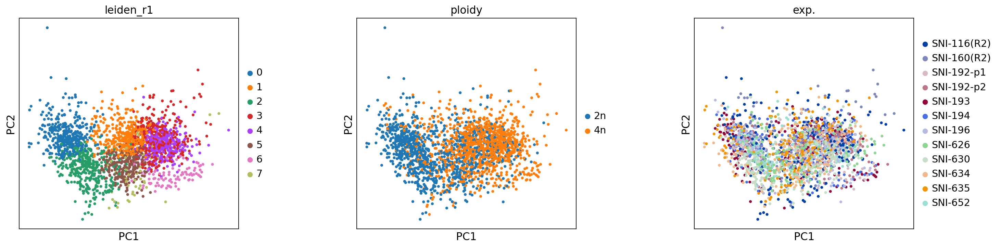

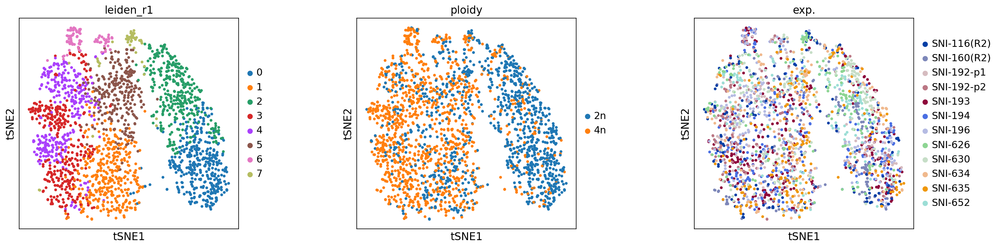

In [23]:
rcParams['figure.figsize']=(5,5)
sc.tl.leiden(adata_young, resolution=1, key_added='leiden_r1')
sc.pl.pca(adata_young, wspace=0.4, color=["leiden_r1", "ploidy","exp."])
sc.pl.tsne(adata_young, wspace=0.4, color=["leiden_r1", "ploidy","exp."])

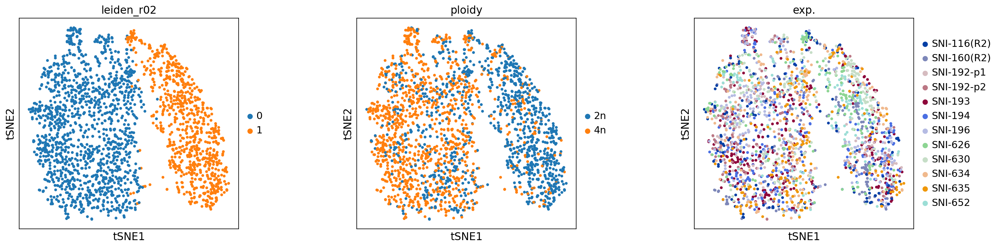

In [24]:
# low resolution louvain clustering to separate hepatocytes from non-parenchymal cells
sc.tl.leiden(adata_young, resolution=0.2, key_added='leiden_r02')
sc.pl.tsne(adata_young, wspace=0.4, color=["leiden_r02", "ploidy","exp."])

In [25]:
adata_young.obs['low_res_ct'] = adata_young.obs['leiden_r02']

Label 4n cells that are in the non-parenchymal cluster.

In [26]:
adata_young.obs['clusters'] = "2-2n"
adata_young.obs['clusters'].loc[np.logical_and(adata_young.obs['low_res_ct']=='0', 
                                         adata_young.obs['ploidy']=='2n')] = "2n_hepatocytes"
adata_young.obs['clusters'].loc[np.logical_and(adata_young.obs['low_res_ct']=='0', 
                                         adata_young.obs['ploidy']=='4n')] = "4n_hepatocytes"
adata_young.obs['clusters'].loc[np.logical_and(adata_young.obs['low_res_ct']=='1', 
                                         adata_young.obs['ploidy']=='2n')] = "2n_other_cluster"
adata_young.obs['clusters'].loc[np.logical_and(adata_young.obs['low_res_ct']=='1', 
                                         adata_young.obs['ploidy']=='4n')] = "4n_other_cluster"
adata_young.obs['clusters'] = adata_young.obs['clusters'].astype('category')

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


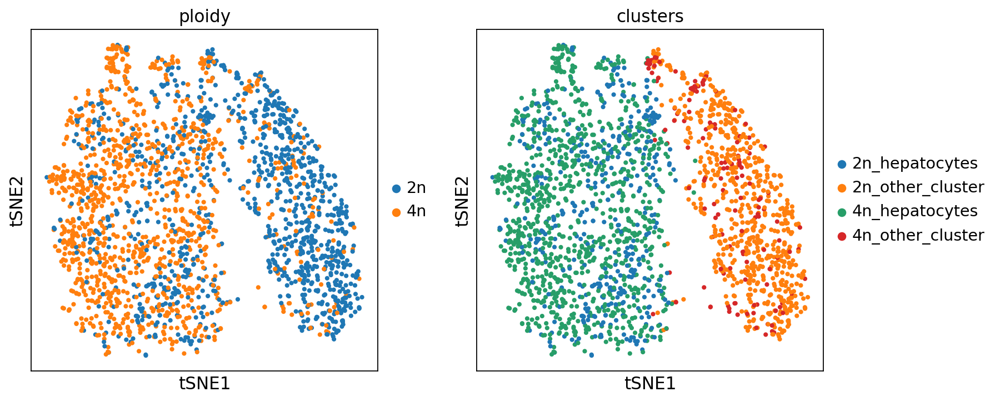

In [27]:
sc.pl.tsne(adata_young, color=['ploidy', 'clusters'])

Compute a gene set score for every gene set.

In [28]:
for key in cell_type_id_dict.keys():
    sc.tl.score_genes(adata_young, cell_type_id_dict[key], score_name='score_' + key, use_raw=True)

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


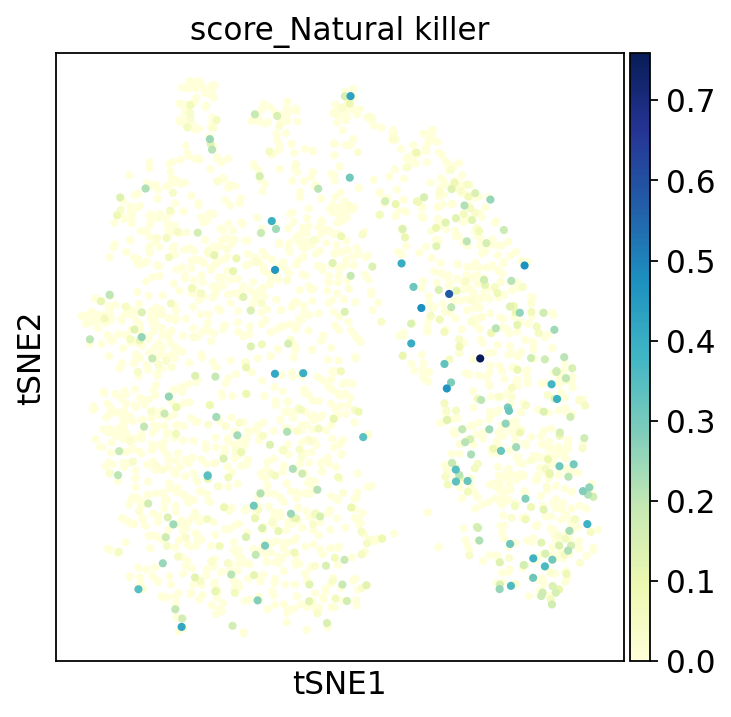

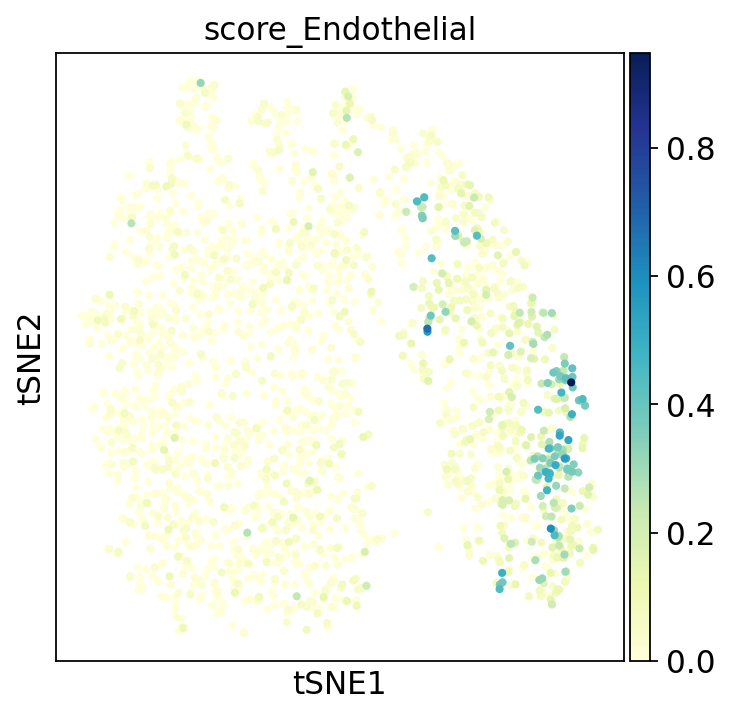

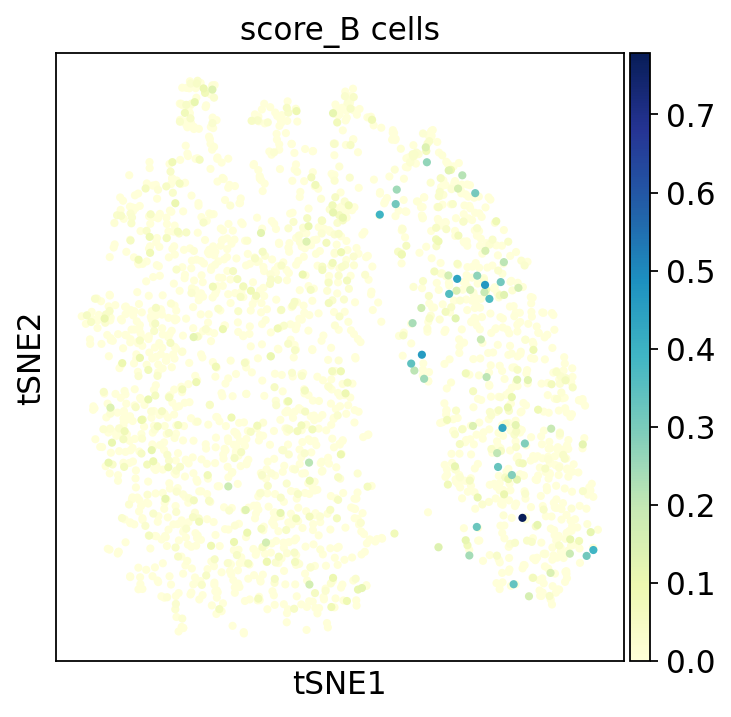

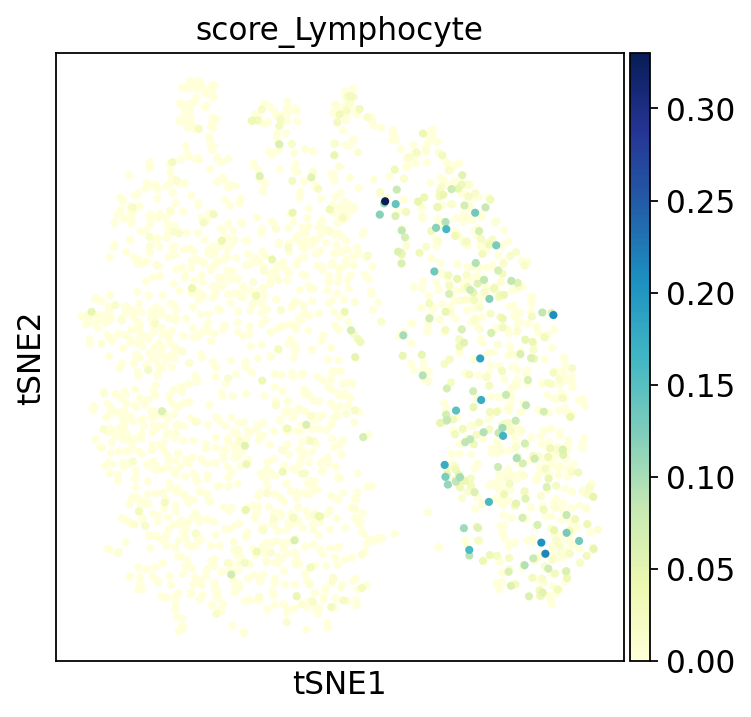

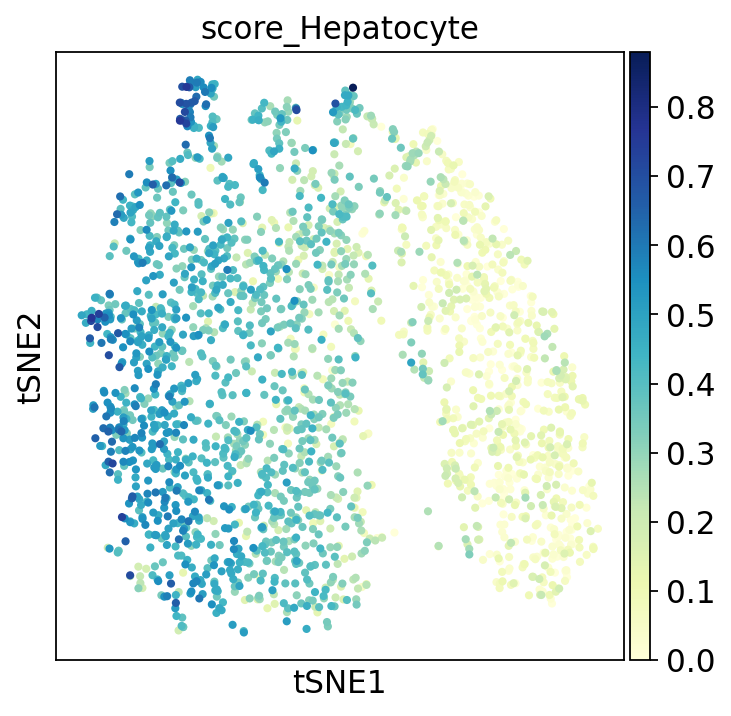

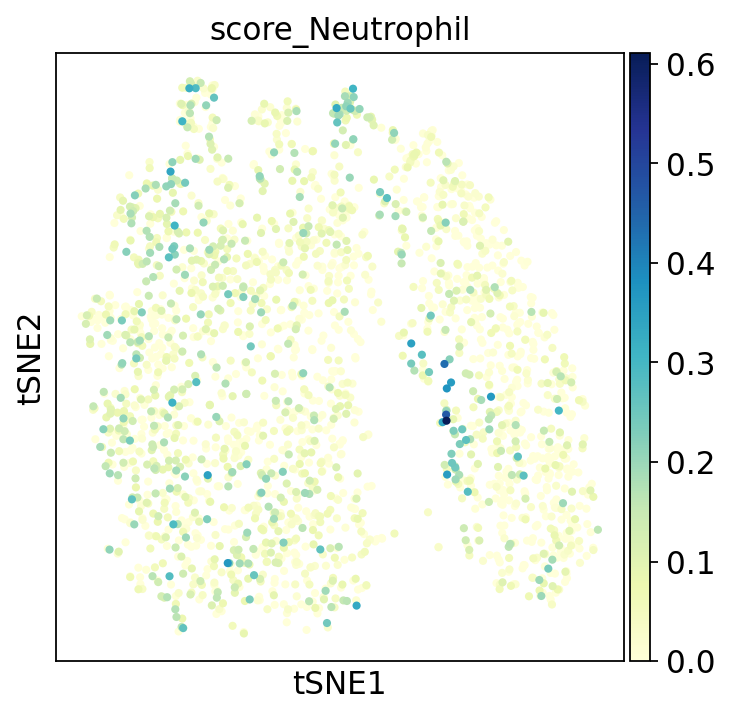

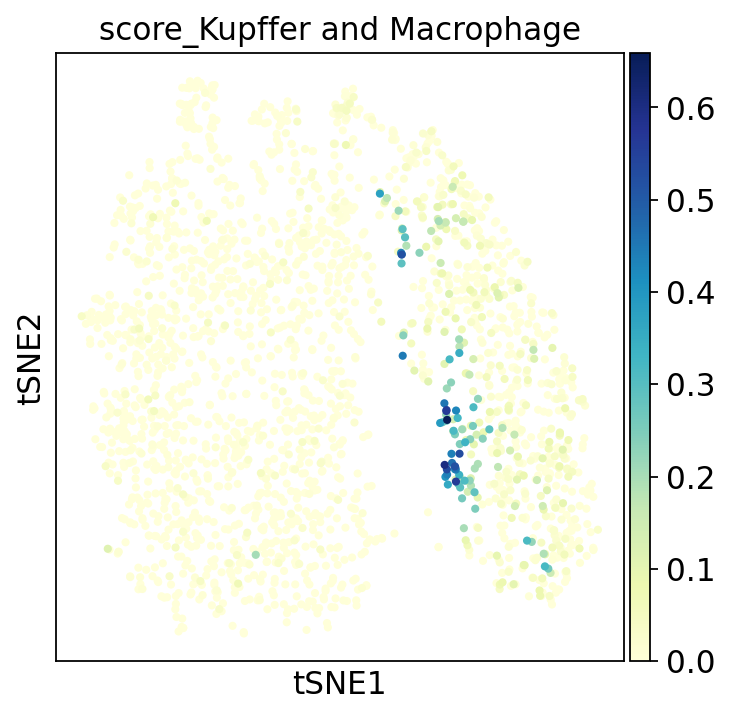

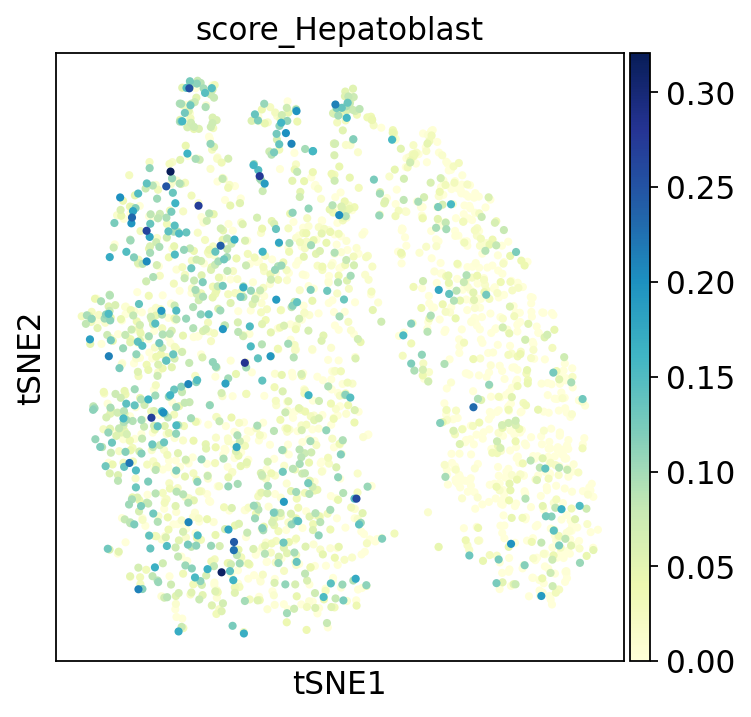

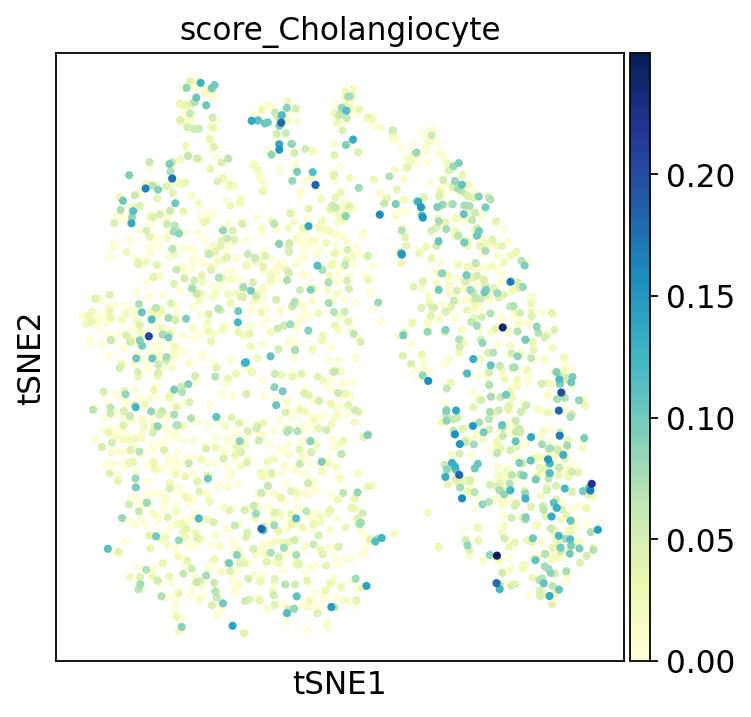

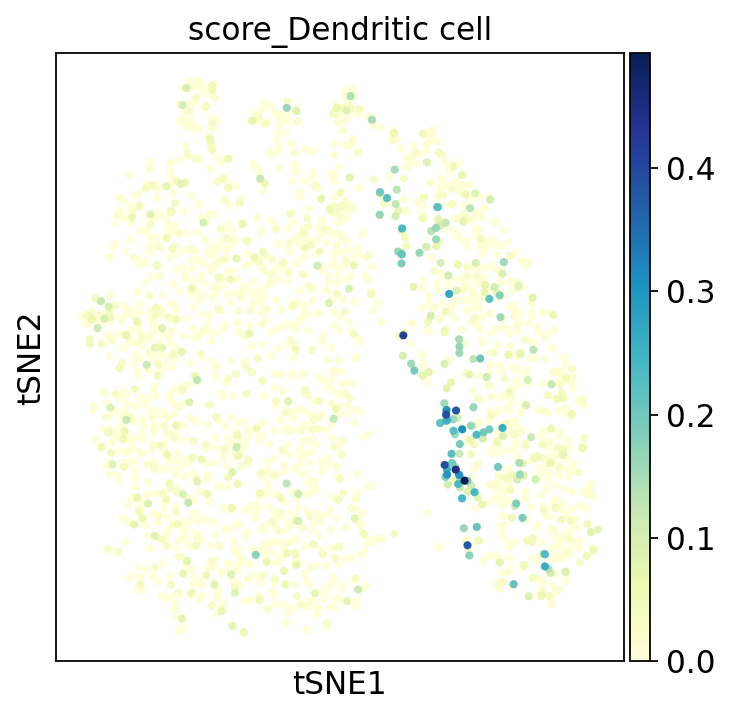

In [29]:
rcParams['figure.figsize']=(5,5)
for key in cell_type_id_dict.keys():
    sc.pl.tsne(adata_young, color='score_' + key, cmap='YlGnBu', vmin=0)

In [30]:
# high resolution clustering for the non-parenchymal cells
sc.tl.leiden(adata_young, resolution=2.5, key_added='leidenr02_02', restrict_to=['leiden_r02', ['1']])
#sc.tl.louvain(adata, resolution=0.75, key_added='louvainr02_02', restrict_to=['louvainr02_02', ['1,0']])
#sc.tl.louvain(adata, resolution=0.5, key_added='louvainr02_02', restrict_to=['louvainr02_02', ['0']])
#sc.tl.louvain(adata, resolution=0.75, key_added='louvainr02_02', restrict_to=['louvainr02_02', ['0,2']])

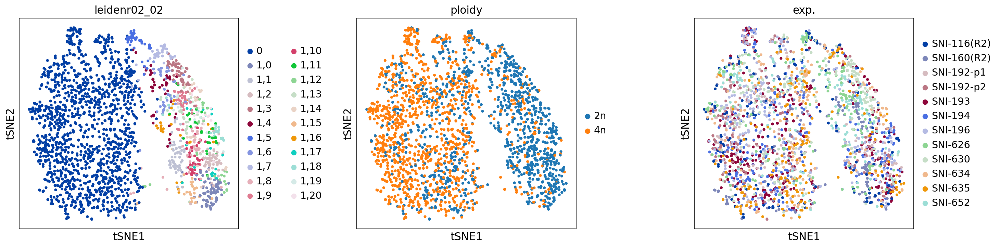

In [31]:
rcParams['figure.figsize']=(5,5)
sc.pl.tsne(adata_young, wspace=0.4, color=["leidenr02_02", "ploidy","exp."])

In [32]:
pd.crosstab(adata_young.obs['leidenr02_02'],adata_young.obs['cell_type'])

cell_type,2n Hepatocytes,4n Hepatocytes,Hepatobiliary cells,Endothelial cells,Kupffer and Dendritic cells,Lymphocytes,Stellate cells,not annotated
leidenr02_02,,,,,,,,
0,332,792,4,1,0,3,0,286
"1,0",0,0,0,6,0,59,0,12
"1,1",0,0,0,0,45,2,0,17
"1,2",0,0,0,44,0,4,2,12
"1,3",0,0,7,0,0,17,0,30
"1,4",0,2,9,3,6,2,0,27
"1,5",0,0,44,0,0,0,0,3
"1,6",3,0,22,5,0,1,1,12
"1,7",0,0,35,0,0,0,0,7


Make a rough annotation based on a majority vote with the wild type cells.

In [33]:

adata_young.obs["cell_type"].loc[np.logical_and(adata_young.obs['cell_type']=='not annotated',
                                                np.in1d(adata_young.obs["leidenr02_02"], 
                                         ['1,5', '1,6', '1,7']))] = 'Hepatobiliary cells'
adata_young.obs["cell_type"].loc[np.logical_and(adata_young.obs['cell_type']=='not annotated',
                                                np.in1d(adata_young.obs["leidenr02_02"], 
                                         ['1,1', '1,4']))] = 'Kupffer and Dendritic cells'
adata_young.obs["cell_type"].loc[np.logical_and(adata_young.obs['cell_type']=='not annotated',
                                                np.in1d(adata_young.obs["leidenr02_02"], 
                                         ['1,11', '1,18']))] = 'Stellate cells' 
adata_young.obs["cell_type"].loc[np.logical_and(adata_young.obs['cell_type']=='not annotated',
                                                np.in1d(adata_young.obs["leidenr02_02"], 
                                         ['1,2', '1,12', '1,17', '1,20']))] = 'Endothelial cells'
adata_young.obs["cell_type"].loc[np.logical_and(adata_young.obs['cell_type']=='not annotated',
                                                np.in1d(adata_young.obs["leidenr02_02"], 
                                         ['1,0', '1,3','1,8','1,9','1,10',
                                          '1,13','1,14','1,15', '1,16', '1,19']))] = 'Lymphocytes'

adata_young.obs["cell_type"][adata_young.obs["clusters"]=='2n_hepatocytes'] = '2n Hepatocytes'
adata_young.obs["cell_type"][adata_young.obs["clusters"]=='4n_hepatocytes'] = '4n Hepatocytes'

adata_young.obs['cell_type'] = adata_young.obs['cell_type'].cat.remove_unused_categories() 


In [34]:
adata_young.obs['cell_type'].value_counts()

4n Hepatocytes                 995
2n Hepatocytes                 430
Lymphocytes                    382
Hepatobiliary cells            139
Endothelial cells              131
Kupffer and Dendritic cells    101
Stellate cells                  50
Name: cell_type, dtype: int64

In [35]:
adata_young.obs['cell_type'].value_counts(normalize=True)

4n Hepatocytes                 0.446589
2n Hepatocytes                 0.192998
Lymphocytes                    0.171454
Hepatobiliary cells            0.062388
Endothelial cells              0.058797
Kupffer and Dendritic cells    0.045332
Stellate cells                 0.022442
Name: cell_type, dtype: float64

Set cell type colors.

In [48]:
adata_young.uns["cell_type_colors"] = ["#1f77b4", "#ff7f0e",
                                       #"#332288", "#332288", #Hepatocyte color
                                       "#8c564b",
                                       "#DC050C","#FFAABB","#ade8e3","#17becf"]

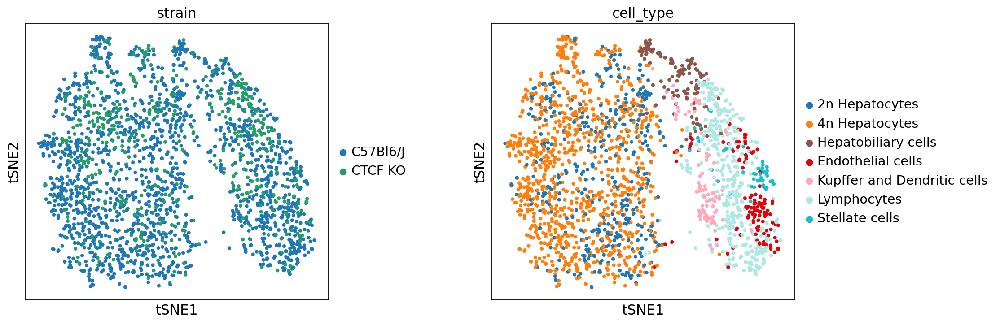

In [39]:
rcParams['figure.figsize']=(5,5)
sc.pl.tsne(adata_young, wspace=0.4, color=['strain', "cell_type"])

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


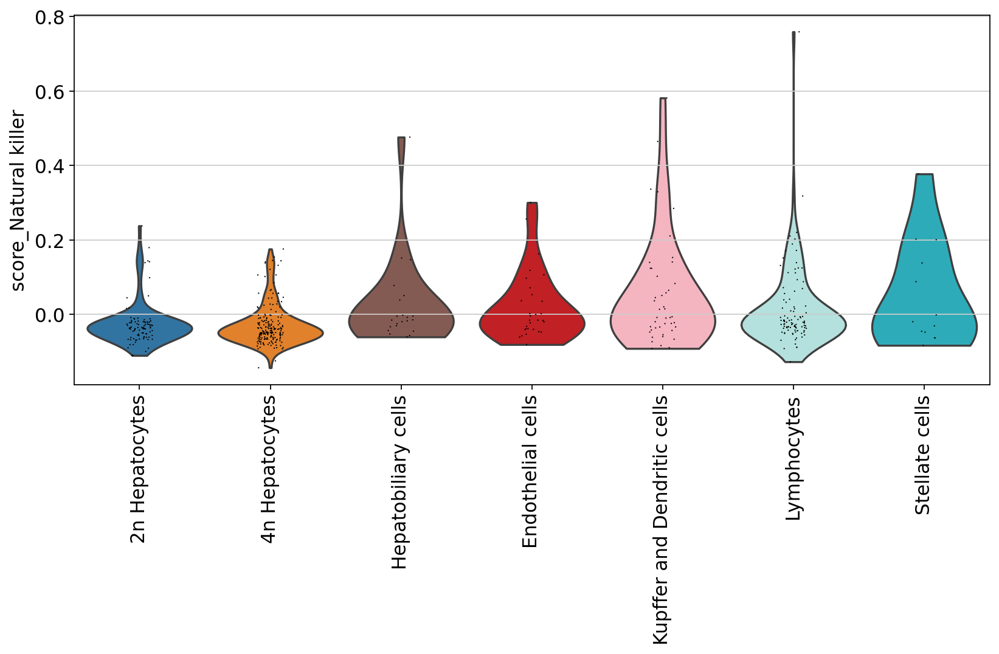

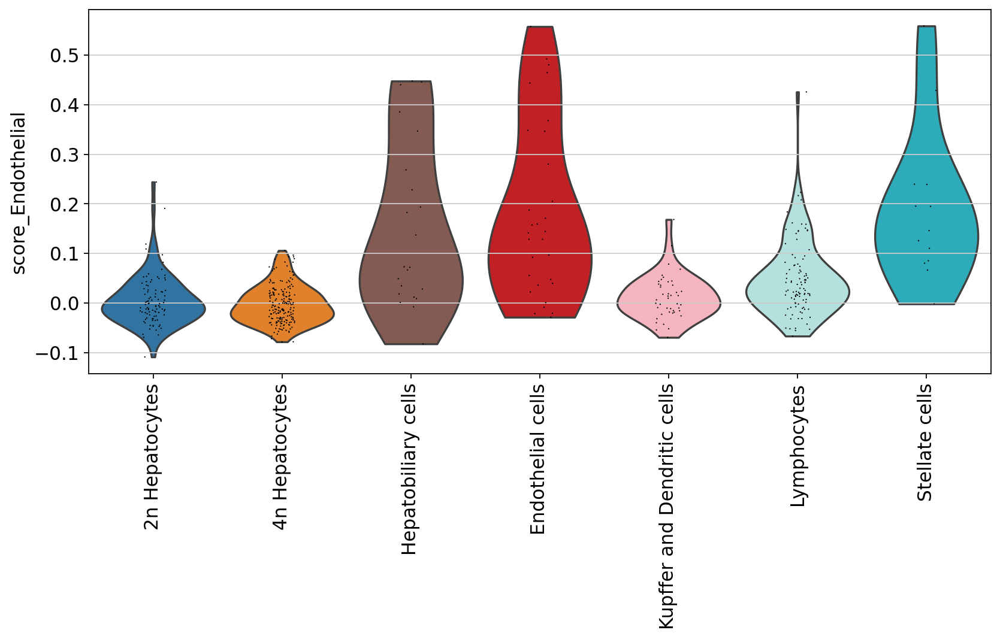

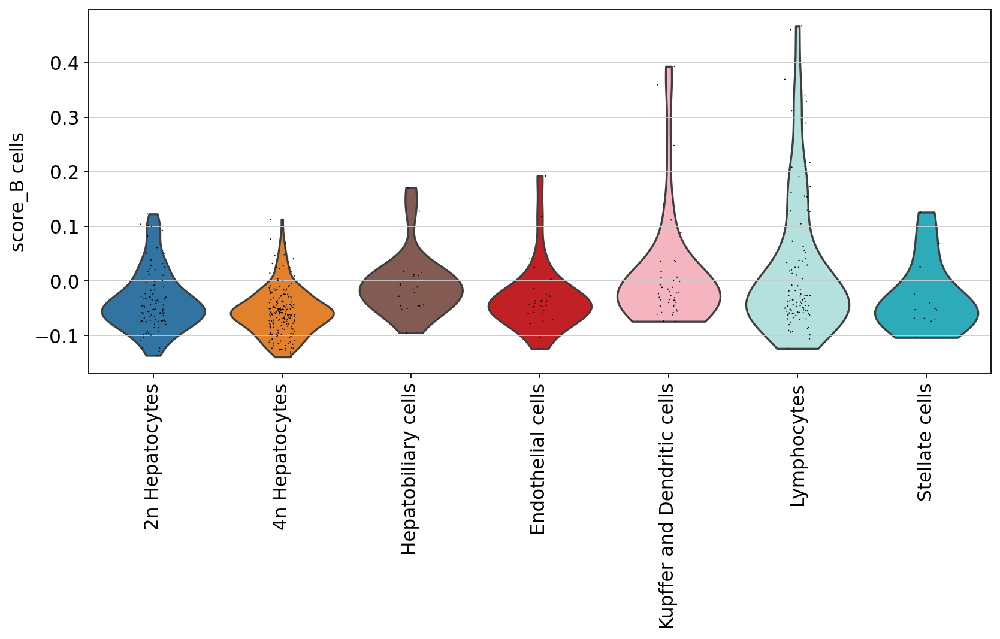

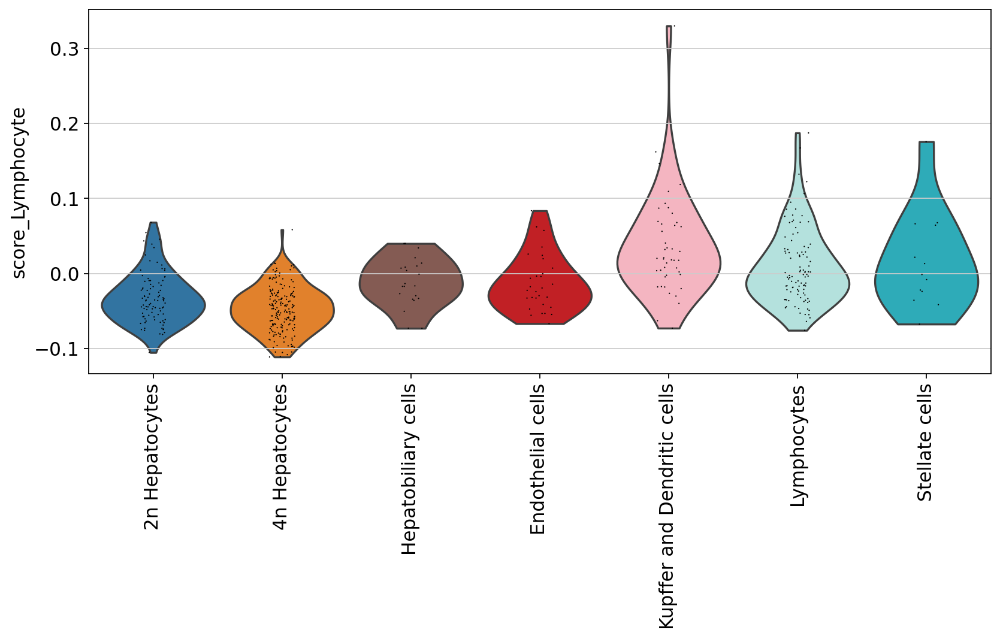

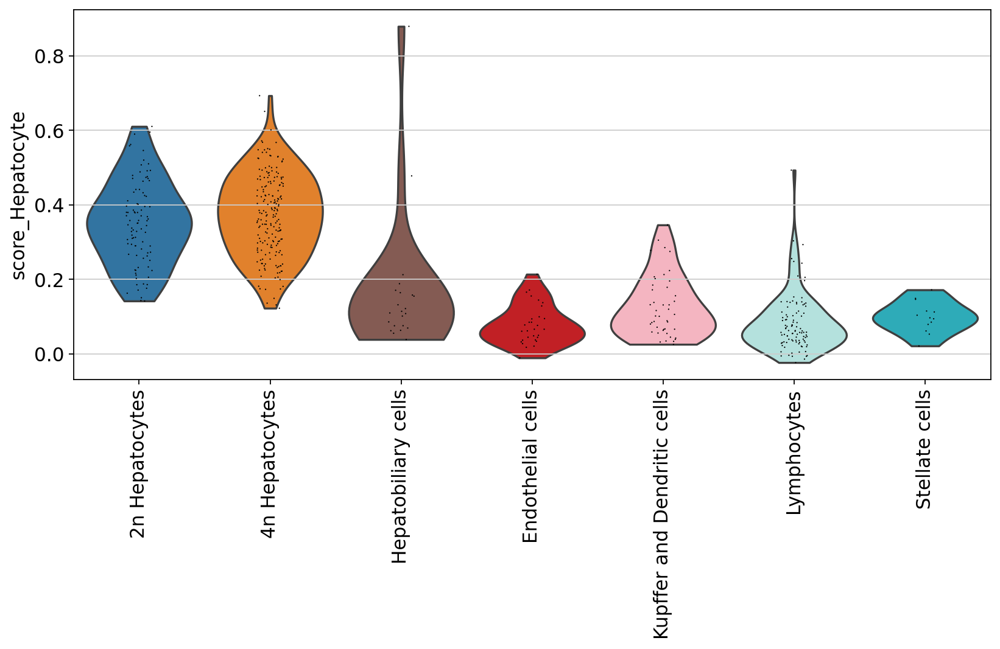

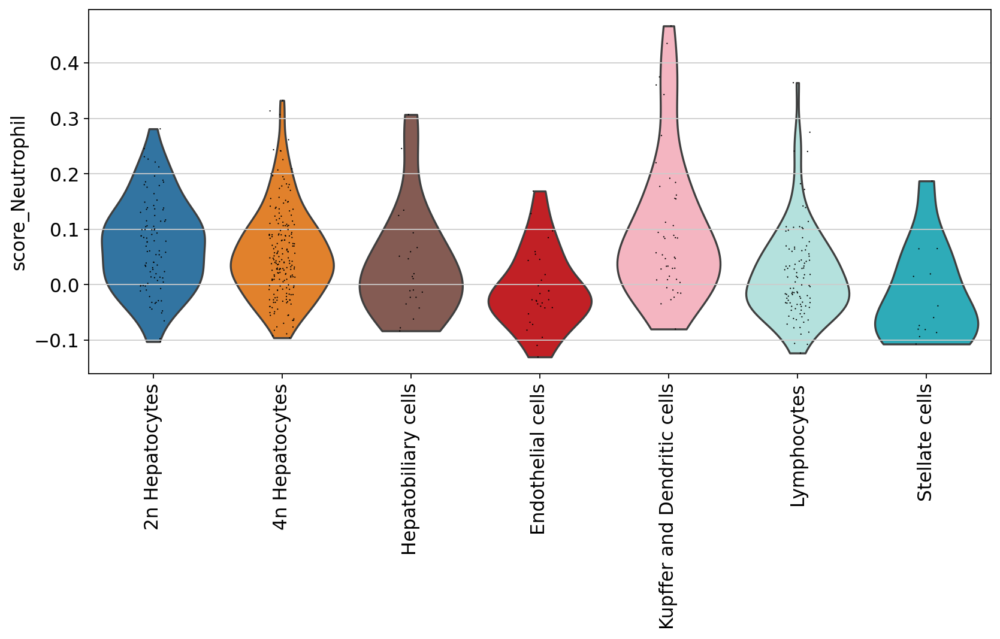

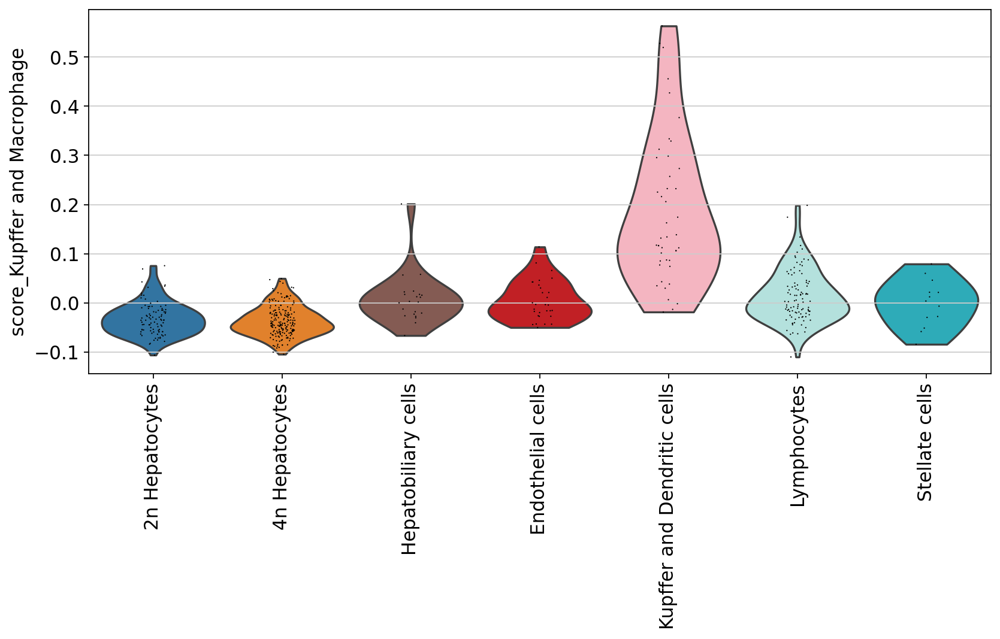

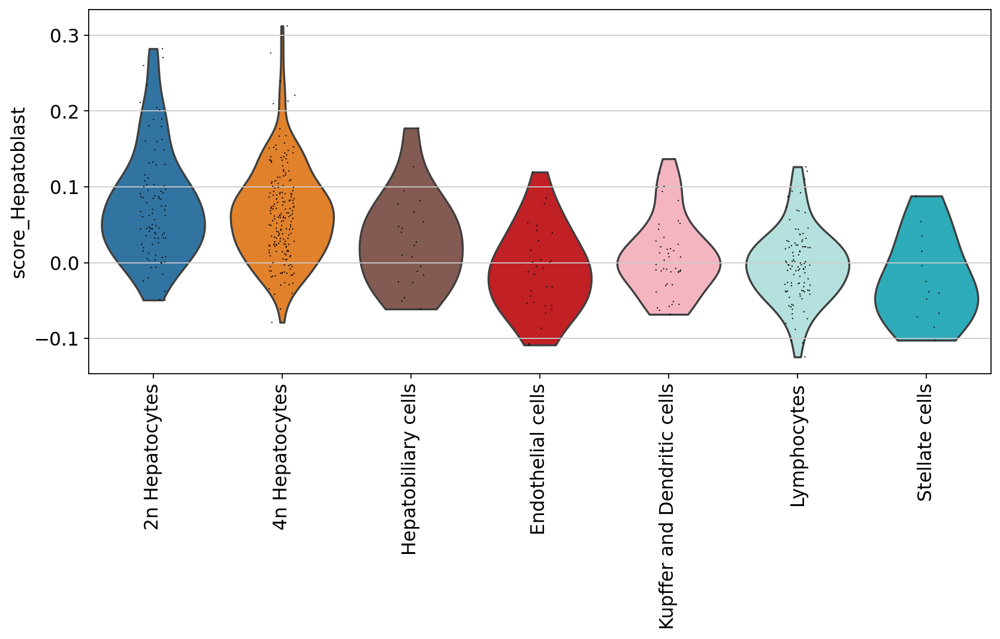

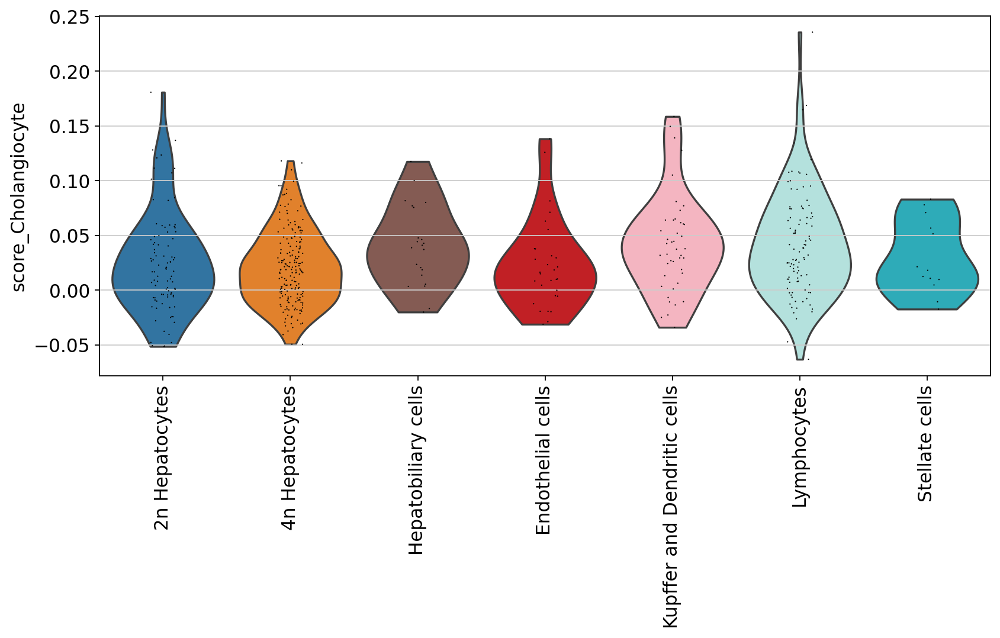

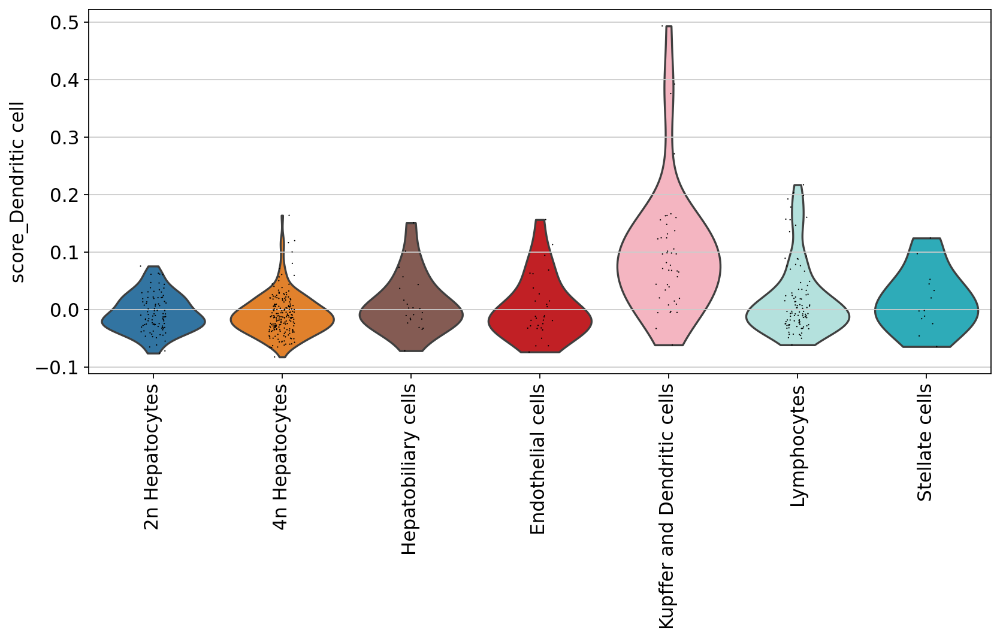

In [49]:
rcParams['figure.figsize']=(10,5)
for key in cell_type_id_dict.keys():
    sc.pl.violin(adata_young, keys='score_' + key, groupby='cell_type', rotation=90)

Take only knock-out cells and re-compute embedding.

In [40]:
adata_young = adata_young[adata_young.obs['strain']==strain]

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [41]:
sc.pp.pca(adata_young, svd_solver='arpack')
sc.pp.neighbors(adata_young)
sc.tl.tsne(adata_young, perplexity=30, n_pcs=10)

In [42]:
chol_markers = ['Sptbn1','Sox9','Sox4','Kit','Slc22a3',
                'Hnf1b','Erbb3','Fgfr2','Fgfr3','Sorl1','Wwc1',
                'Cftr','Pkd2','Pkhd1l1','Lrp2','Cdh11','Igfbp5','Wt1','Igfbp6',
                'Wnt2b','Bmp4','Sulf2','Gas1','Gpc3','Vim','Fgf1','Onecut1',
                'Klra2','Ccl5','Pla2g7','Clec12a','Itgal','Folr2','Cybb','Cd38',
                'Epcam','Cdh1']

hepatoblast_markers = ["Ncam1","Cd44","Dlk1","Icam1","Epcam","Cdh1","Onecut3","Afp","Agt","Fgg",
                       "Gsta1","Id3","Lin28b","Etv5","Lgr5","Tbx3","Foxm1","Kit",
                      "Onecut1","Onecut2","Notch2","Tbx3","Hnf1b","Hes1","Foxa2","Foxa3","Hhex",
                       "Sall4","Hnf4a","Alb","Krt19","Epcam","Tacstd2","Anpep","Itga6","Cd133",
                       "Thy1","Fgf7","Sox9","Krt18","Krt19","Cebpa","Serpina16","Mki67","Krt7",
                       "Tmem45b","Tacstd2","Igdcc4","Itga6","Ptprcap","Atxn1"]

nmarker_name = {}
nmarker_id = []
index = 0
for n in adata.var["gene_name"].tolist():
    if n in hepatoblast_markers:
        nmarker_name[n] = adata_young.var_names[index]
        nmarker_id.append(adata_young.var_names[index])
    index += 1

adatah = adata_young[:,nmarker_id].copy()

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [43]:
adata_young.obs["hblast_marker_sum"] = np.sum(adatah.layers["raw"], axis=1)

Color the clusters nicely

In [50]:
adata_young.uns["low_res_ct_colors"] = ["#686868", "#a9a9a9"]

In [51]:
adata_young.uns["cell_type1_colors"] = ["#332288", #"#332288", #Hepatocyte color
                                       "#8c564b",
                                       "#DC050C","#FFAABB","#ade8e3","#17becf"]

Combine the hepatocytes and re-arrange the levels.

In [52]:
adata_young.obs['cell_type1'] = adata_young.obs['cell_type'].cat.add_categories(['Hepatocytes'])
adata_young.obs['cell_type1'][np.in1d(adata_young.obs['cell_type'], 
                                      ["2n Hepatocytes", "4n Hepatocytes"])] = 'Hepatocytes'
adata_young.obs['cell_type1'] = adata_young.obs['cell_type1'].cat.remove_unused_categories()
adata_young.obs['cell_type1'] = adata_young.obs['cell_type1'].cat.reorder_categories(['Hepatocytes', 
                                              'Hepatobiliary cells', 'Endothelial cells', 
                                     "Kupffer and Dendritic cells", 'Lymphocytes', 'Stellate cells' ])

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


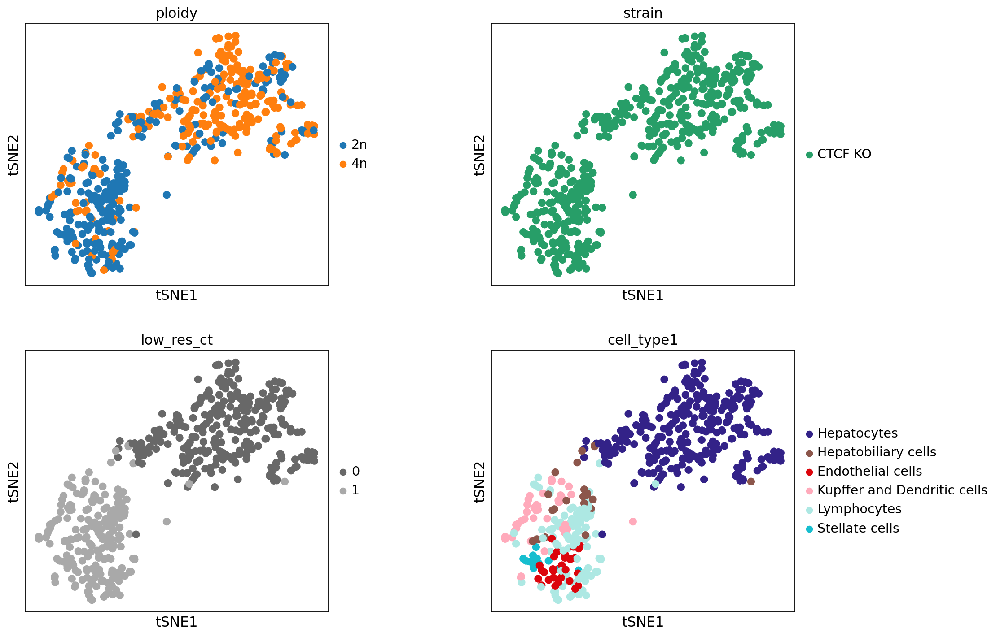

In [54]:
rcParams['figure.figsize']=(5,5)
sc.pl.tsne(adata_young, color=["ploidy", "strain", "low_res_ct", "cell_type1"],
           ncols=2, wspace=0.4, save="_" + today + "_young_"+ ko_prefix+"_prelim_annotation.pdf")

Save the annotated `adata` file.

In [55]:
adata_young.write(data_dir + 'snRNAseq_mouse_hepatocytes_young_'+ ko_prefix +'_filtered_TPM_jul21_annotated.h5ad')

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [11]:
adata_young = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_young_'+ ko_prefix +'_filtered_TPM_jul21_annotated.h5ad')

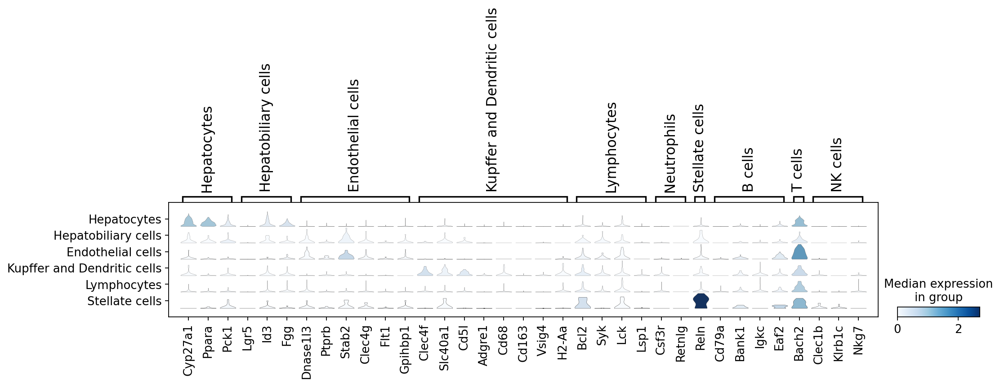

In [12]:
# plotting the markers nicely (using scanpy 1.6)


small_marker_dict = {"Hepatocytes":["Cyp27a1","Ppara","Pck1"],
                    "Hepatobiliary cells":["Lgr5","Id3","Fgg"],
                    "Endothelial cells":["Dnase1l3","Ptprb","Stab2", "Clec4g", "Flt1","Gpihbp1"],
                    "Kupffer and Dendritic cells":["Clec4f","Slc40a1","Cd5l", "Adgre1",  
                                                   "Cd68", "Cd163", "Vsig4", "H2-Aa"],
                    "Lymphocytes":["Bcl2","Syk","Lck", 'Lsp1'],
                     "Neutrophils":["Csf3r", "Retnlg"],
                     'Stellate cells': ['Reln'],
                    "B cells": ["Cd79a", "Bank1", "Igkc", 'Eaf2'],
                     "T cells": ["Bach2"],
                    "NK cells": ["Clec1b", "Klrb1c", "Nkg7"]}

sc.pl.stacked_violin(adata_young, gene_symbols="gene_name", groupby="cell_type1", 
                     var_names=small_marker_dict, save='_'+today+"_young_" + ko_prefix+ "_prelim_annotation_markers.pdf")

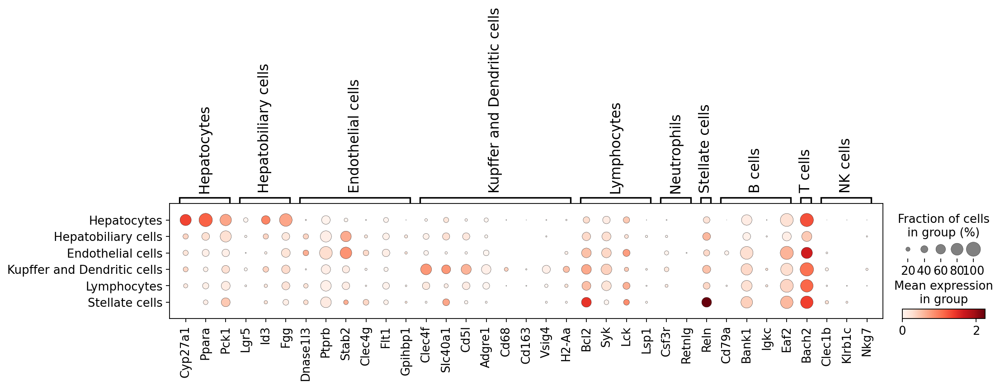

In [13]:
sc.pl.dotplot(adata_young, gene_symbols="gene_name", groupby="cell_type1", 
                     var_names=small_marker_dict, save='_'+today+"_young_" + ko_prefix+ "_prelim_annotation_markers.pdf")

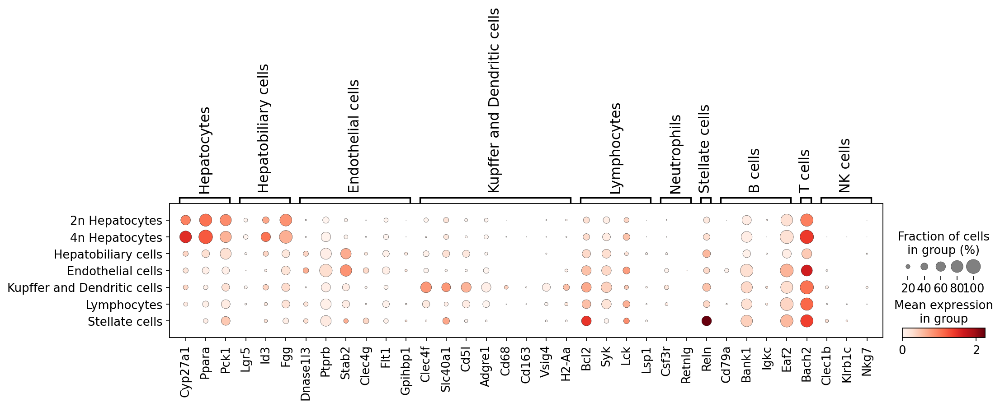

In [14]:
sc.pl.dotplot(adata_young, gene_symbols="gene_name", groupby="cell_type", 
                     var_names=small_marker_dict, save='_'+today+"_young_" + ko_prefix+ "_prelim_annotation_markers2.pdf")

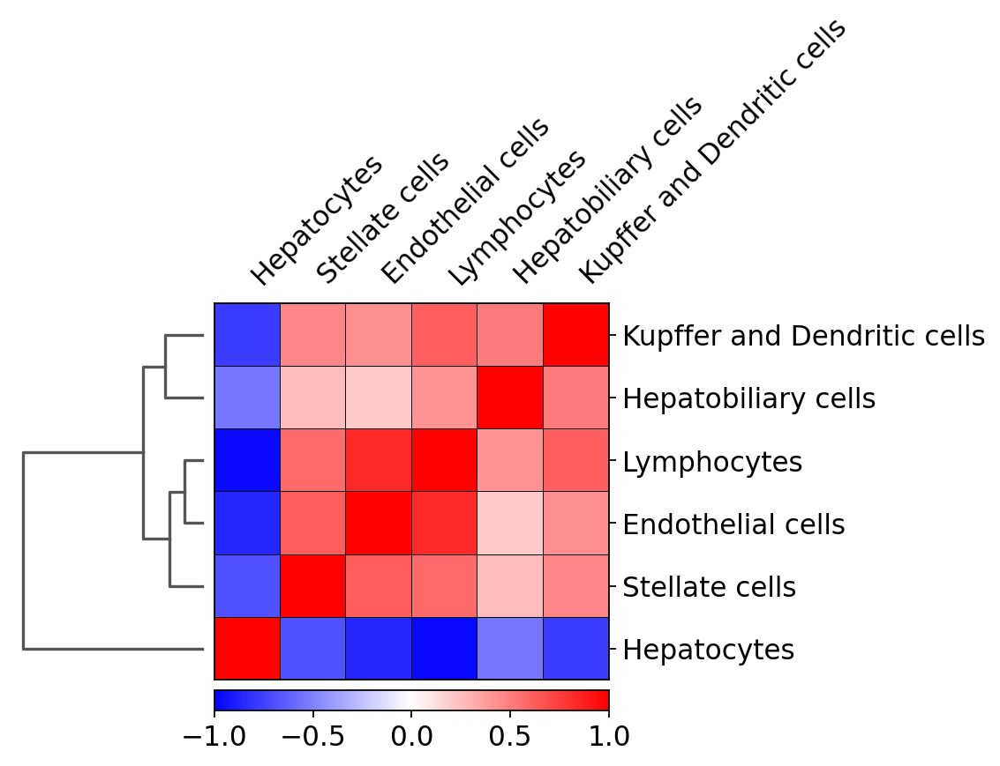

In [15]:
sc.pl.correlation_matrix(adata_young, groupby="cell_type1",save='_'+today+"_young_" + ko_prefix + "_correlation_matrix.pdf")

In [56]:
proportions_young = pd.crosstab(adata_young.obs['cell_type'], 
                                adata_young.obs['strain'], margins=True, normalize=1)*100

In [57]:
proportions_young

strain,CTCF KO,All
cell_type,,
2n Hepatocytes,18.585859,18.585859
4n Hepatocytes,39.191919,39.191919
Hepatobiliary cells,4.444444,4.444444
Endothelial cells,6.060606,6.060606
Kupffer and Dendritic cells,8.888889,8.888889
Lymphocytes,20.202020,20.202020
Stellate cells,2.626263,2.626263


In [58]:
proportions_young.to_csv(data_dir + 'cell_counts_young_' + ko_prefix + '_'+ today + '.csv' )

## Old mice only

In [59]:
adata_old = adata[adata.obs['age_grouped']=='old'].copy()

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


### Select CTCF knock out cells

Select wild type and CTCF KO cells.

In [60]:
ko_prefix = 'CTCF-KO'
strain = 'CTCF KO'

In [61]:
adata_old = adata_old[np.in1d(adata_old.obs['strain'],['C57Bl6/J', strain])]

Recompute embeddings.

In [62]:
sc.pp.pca(adata_old, svd_solver='arpack')
sc.pp.neighbors(adata_old)
sc.tl.tsne(adata_old, perplexity=30, n_pcs=15)

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


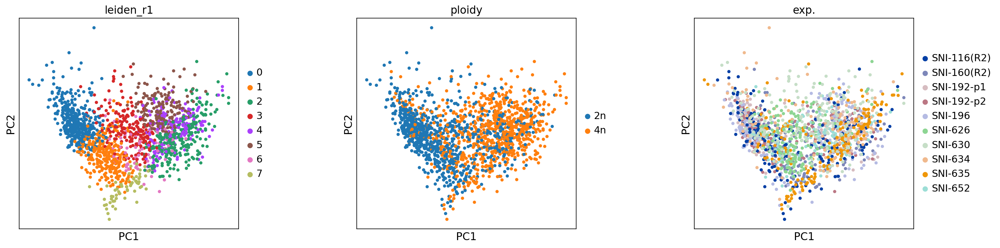

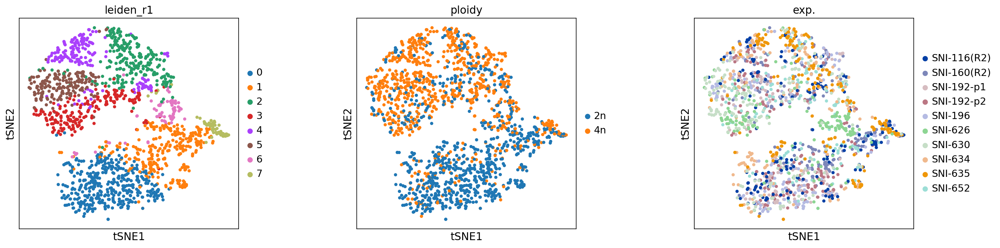

In [63]:
sc.tl.leiden(adata_old, resolution=1, key_added='leiden_r1')
rcParams['figure.figsize']=(5,5)
sc.pl.pca(adata_old, wspace=0.4, color=["leiden_r1", "ploidy","exp."])
sc.pl.tsne(adata_old, wspace=0.4, color=["leiden_r1", "ploidy","exp."])

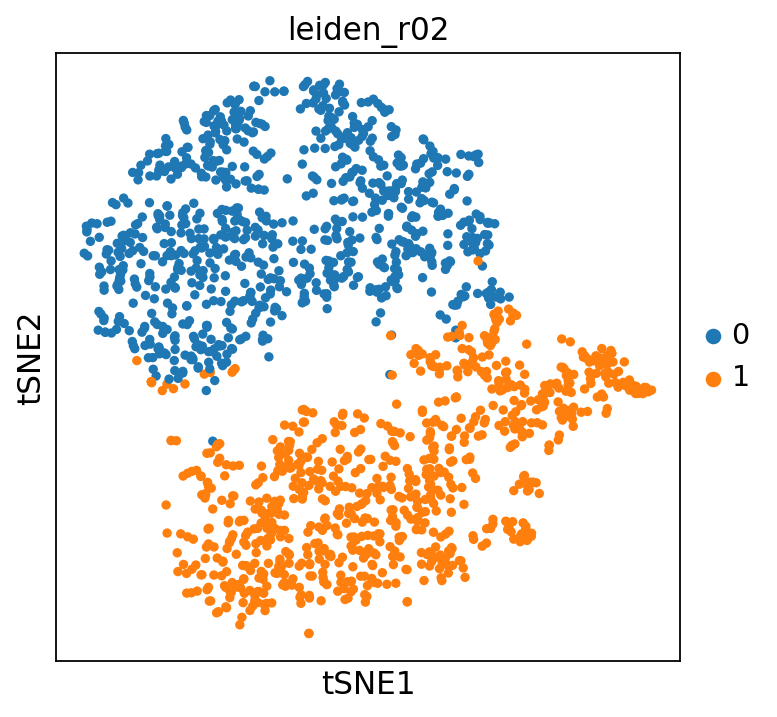

In [64]:
# low resolution louvain clustering to separate hepatocytes from non-parenchymal cells
sc.tl.leiden(adata_old, resolution=0.2, key_added='leiden_r02')
sc.pl.tsne(adata_old, wspace=0.4, color=["leiden_r02"])

In [65]:
adata_old.obs['low_res_ct'] = adata_old.obs['leiden_r02']

Label 4n cells that are in the non-parenchymal cluster.

In [66]:
adata_old.obs['clusters'] = "2-2n"
adata_old.obs['clusters'].loc[np.logical_and(adata_old.obs['low_res_ct']=='0', 
                                             adata_old.obs['ploidy']=='2n')] = "2n_hepatocytes"
adata_old.obs['clusters'].loc[np.logical_and(adata_old.obs['low_res_ct']=='0', 
                                             adata_old.obs['ploidy']=='4n')] = "4n_hepatocytes"
adata_old.obs['clusters'].loc[np.logical_and(adata_old.obs['low_res_ct']=='1', 
                                             adata_old.obs['ploidy']=='2n')] = "2n_other_cluster"
adata_old.obs['clusters'].loc[np.logical_and(adata_old.obs['low_res_ct']=='1', 
                                             adata_old.obs['ploidy']=='4n')] = "4n_other_cluster"
adata_old.obs['clusters'] = adata_old.obs['clusters'].astype('category')

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


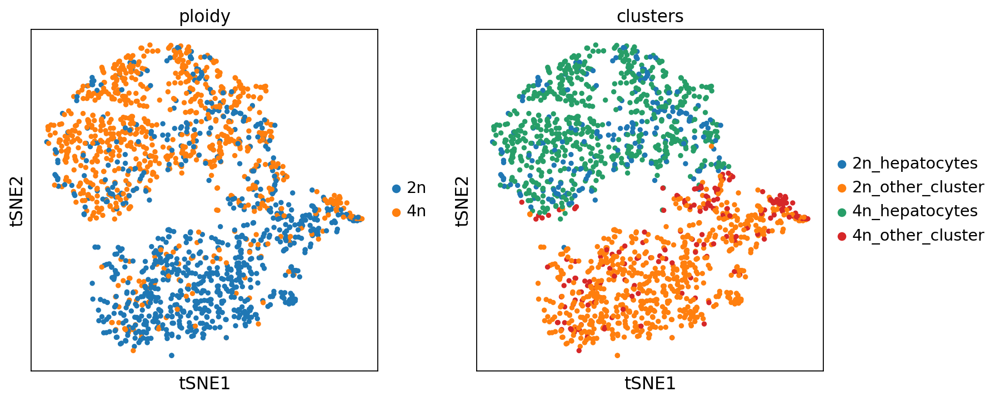

In [67]:
rcParams['figure.figsize']=(5,5)
sc.pl.tsne(adata_old, color=['ploidy', 'clusters'])

Compute a gene set score for every gene set.

In [68]:
for key in cell_type_id_dict.keys():
    sc.tl.score_genes(adata_old, cell_type_id_dict[key], score_name='score_' + key, use_raw=True)

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


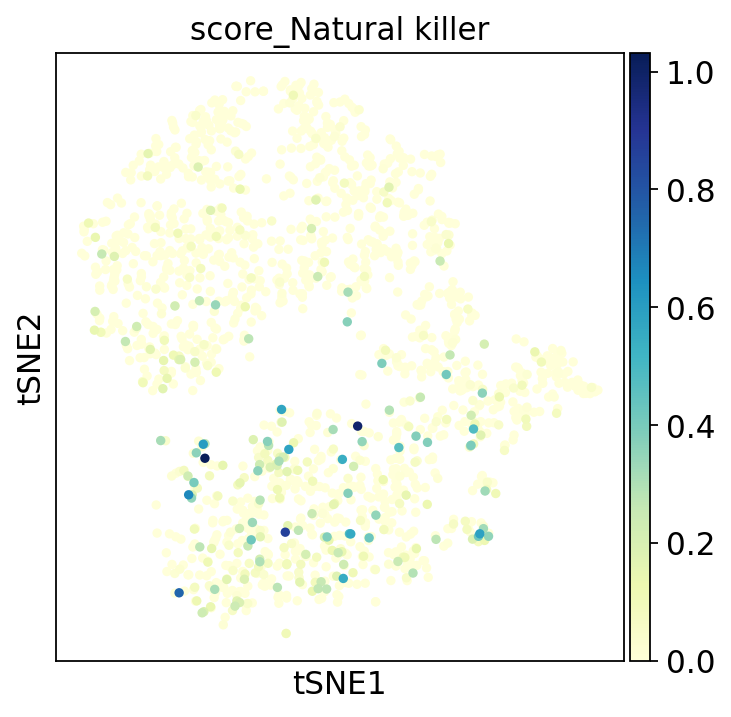

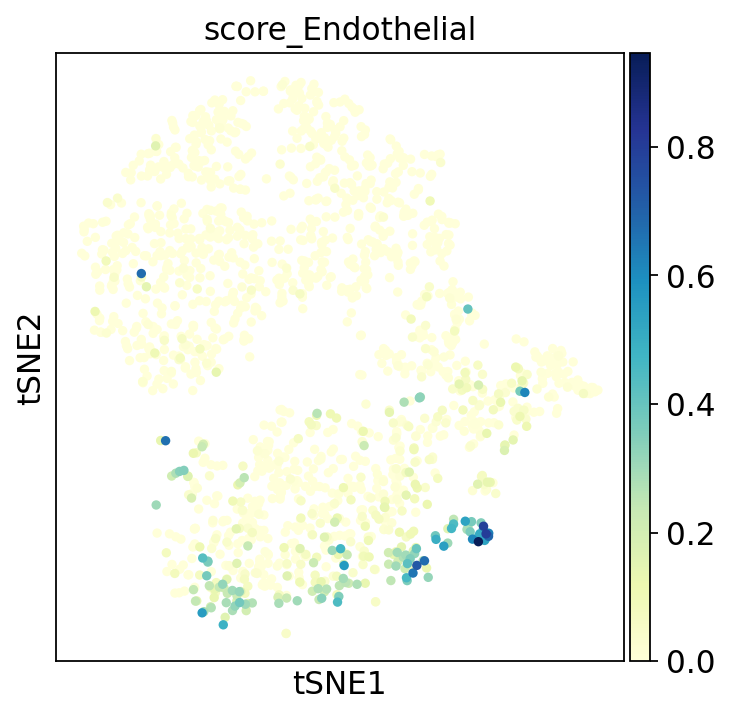

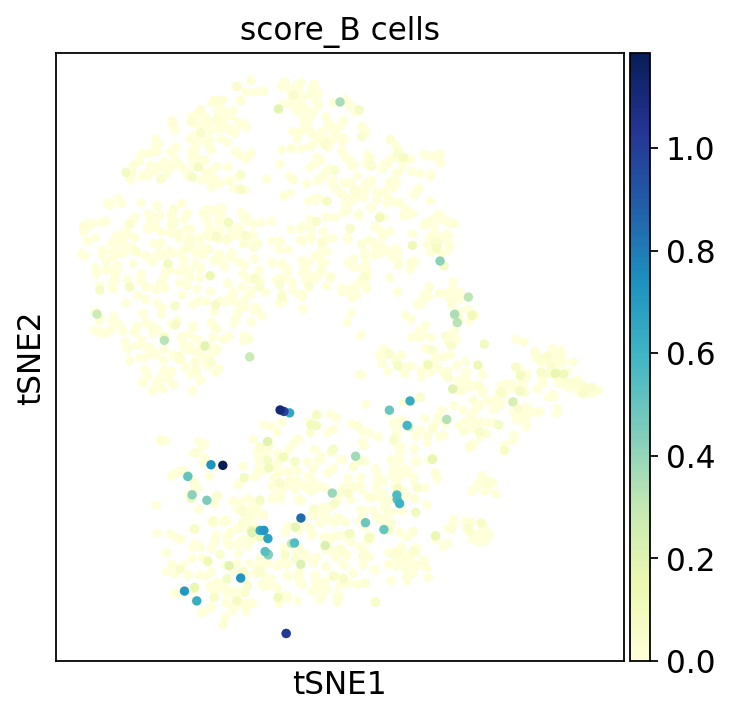

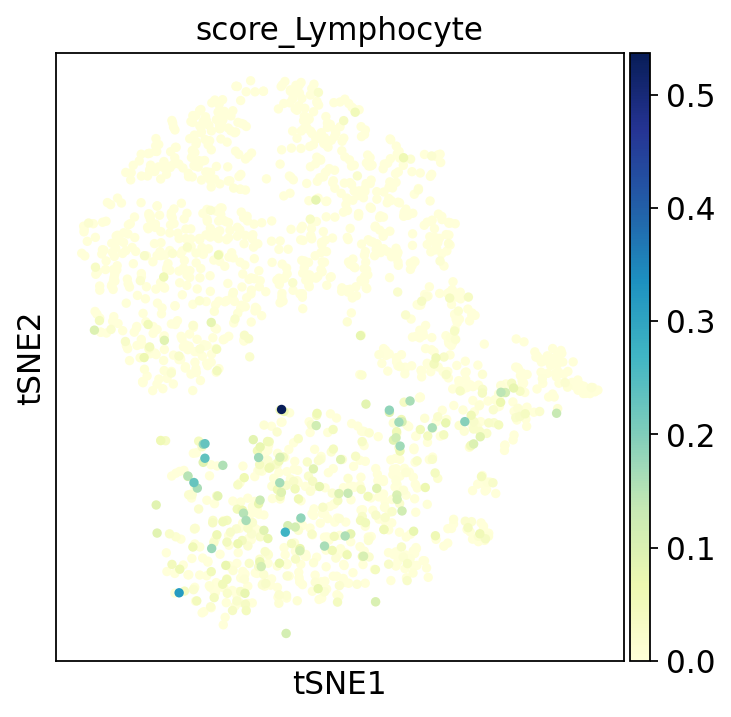

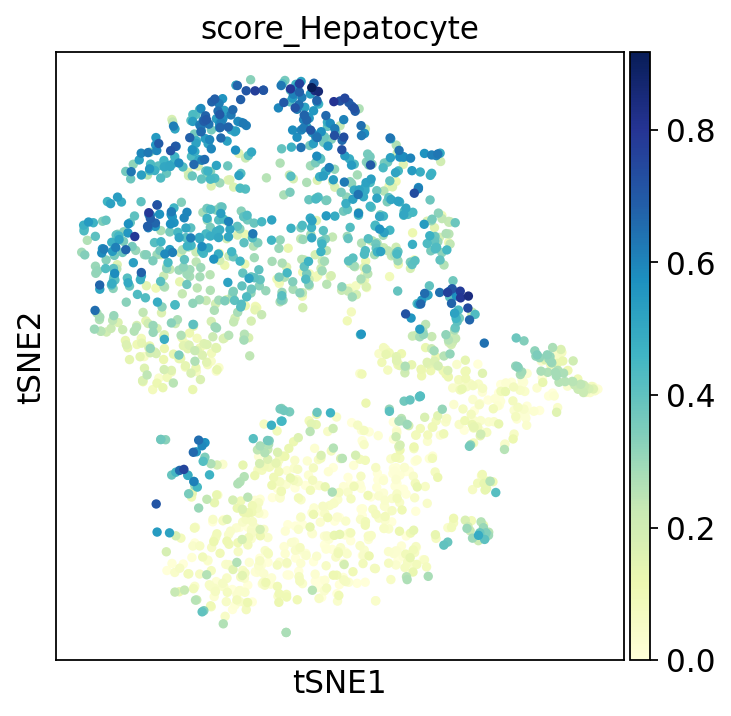

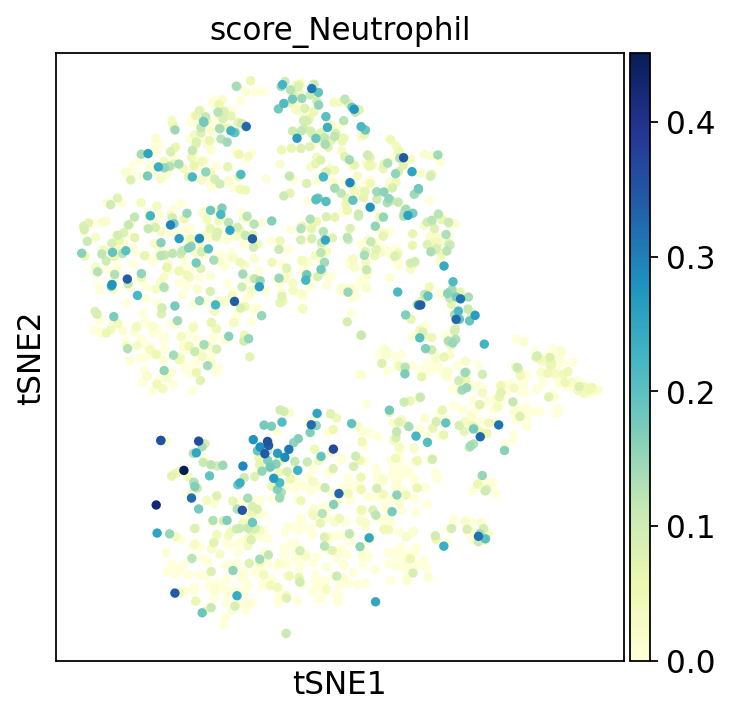

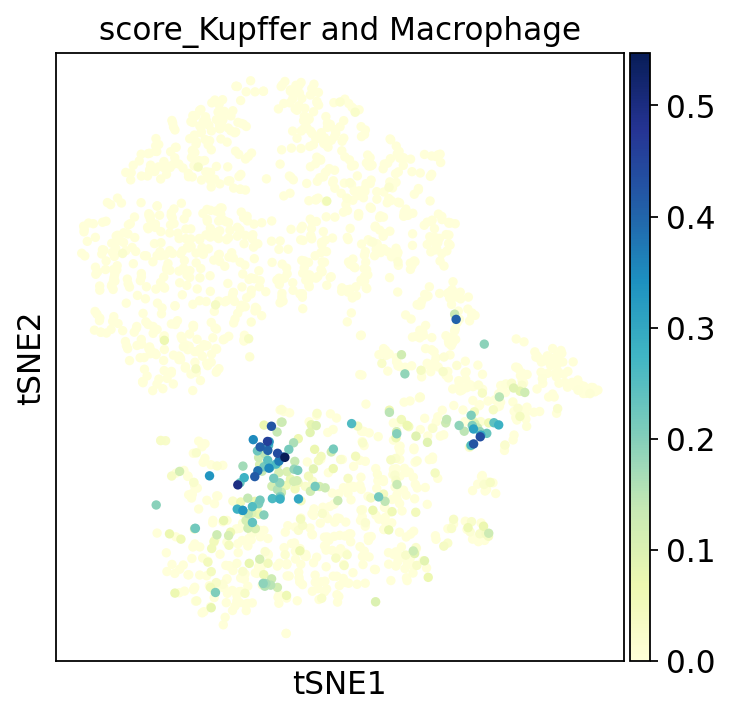

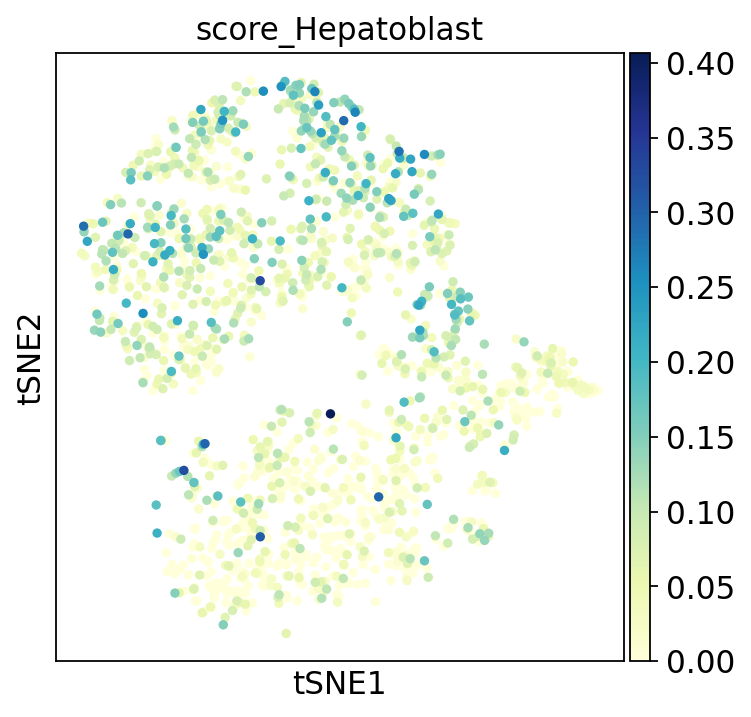

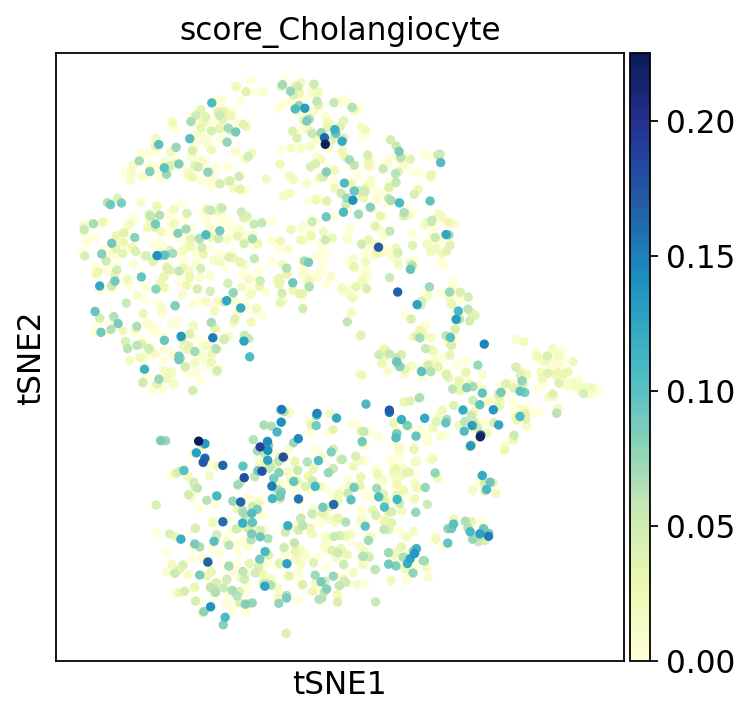

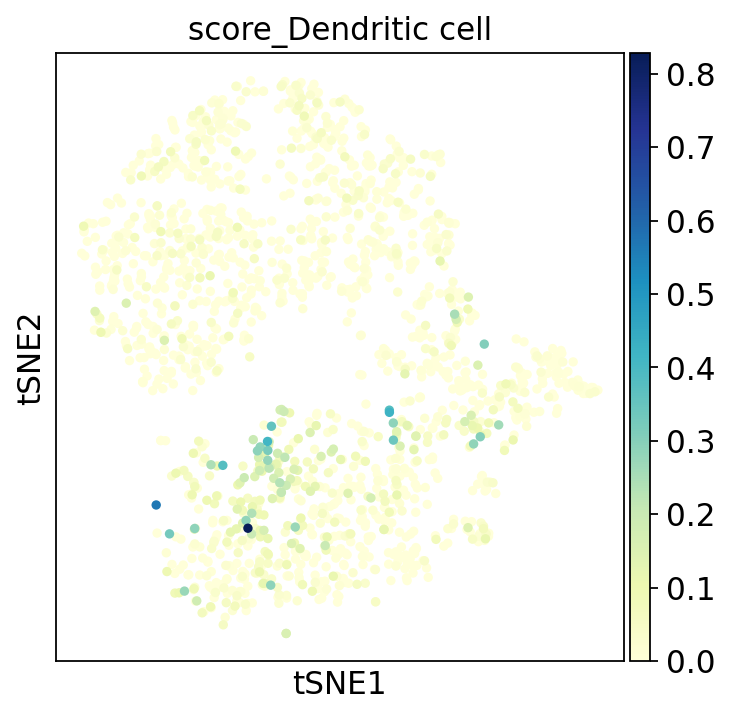

In [69]:
rcParams['figure.figsize']=(5,5)
for key in cell_type_id_dict.keys():
    sc.pl.tsne(adata_old, color='score_' + key, cmap='YlGnBu', vmin=0)

Subcluster non-hepatocytes.

In [70]:
# high resolution clustering for the non-parenchymal cells
sc.tl.leiden(adata_old, resolution=2.5, key_added='leidenr02_02', restrict_to=['leiden_r02', ['1']])
#sc.tl.louvain(adata, resolution=0.75, key_added='louvainr02_02', restrict_to=['louvainr02_02', ['1,0']])
#sc.tl.louvain(adata, resolution=0.5, key_added='louvainr02_02', restrict_to=['louvainr02_02', ['0']])
#sc.tl.louvain(adata, resolution=0.75, key_added='louvainr02_02', restrict_to=['louvainr02_02', ['0,2']])

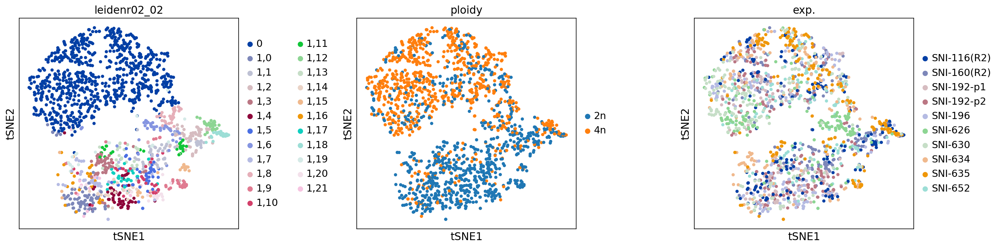

In [71]:
sc.pl.tsne(adata_old, wspace=0.4, color=["leidenr02_02", "ploidy","exp."])

In [72]:
pd.crosstab(adata_old.obs['leidenr02_02'],adata_old.obs['cell_type'])

cell_type,2n Hepatocytes,4n Hepatocytes,Hepatobiliary cells,Endothelial cells,Kupffer and Dendritic cells,Lymphocytes,Stellate cells,not annotated
leidenr02_02,,,,,,,,
0,116,433,0,0,0,0,0,304
"1,0",1,2,0,21,0,26,0,32
"1,1",1,1,1,0,0,24,15,18
"1,2",5,1,0,0,31,0,2,13
"1,3",0,0,0,0,28,7,0,17
"1,4",0,0,0,2,0,24,1,24
"1,5",0,0,1,2,0,36,0,8
"1,6",16,18,0,0,0,5,3,4
"1,7",0,0,2,1,0,25,0,11


Make a rough annotation.

In [73]:

adata_old.obs["cell_type"].loc[np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                              np.in1d(adata_old.obs["leidenr02_02"], 
                                         ['1,19']))] = 'Hepatobiliary cells'
adata_old.obs["cell_type"].loc[np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                              np.in1d(adata_old.obs["leidenr02_02"], 
                                         ['1,2', '1,3', '1,11']))] = 'Kupffer and Dendritic cells'
adata_old.obs["cell_type"].loc[np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                              np.in1d(adata_old.obs["leidenr02_02"], 
                                         ['1,1', '1,15']))] = 'Stellate cells' 
adata_old.obs["cell_type"].loc[np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                              np.in1d(adata_old.obs["leidenr02_02"], 
                                         ['1,9', '1,17', '1,20','1,21']))] = 'Endothelial cells'
adata_old.obs["cell_type"].loc[np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                              np.in1d(adata_old.obs["leidenr02_02"], 
                                         ['1,0','1,4','1,5','1,7', '1,10','1,13','1,14', '1,16']))] = 'Lymphocytes'

adata_old.obs["cell_type"][np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                          np.logical_and(adata_old.obs["clusters"]=='2n_other_cluster',
                                          np.in1d(adata_old.obs['leidenr02_02'],['1,6', '1,8', '1,12','1,18'])
                                         ))] = '2n Hepatocytes'
adata_old.obs["cell_type"][np.logical_and(adata_old.obs["cell_type"]=='not annotated',
                                          np.logical_and(adata_old.obs["clusters"]=='4n_other_cluster',
                                          np.in1d(adata_old.obs['leidenr02_02'],['1,6', '1,8', '1,12','1,18'])
                                         ))] = '4n Hepatocytes'

adata_old.obs["cell_type"][adata_old.obs["clusters"]=='2n_hepatocytes'] = '2n Hepatocytes'
adata_old.obs["cell_type"][adata_old.obs["clusters"]=='4n_hepatocytes'] = '4n Hepatocytes'
adata_old.obs['cell_type'] = adata_old.obs['cell_type'].cat.remove_unused_categories() 


In [74]:
proportions_old = pd.crosstab(adata_old.obs['cell_type'], adata_old.obs['strain'], normalize=1, margins=True)*100

In [75]:
proportions_old

strain,C57Bl6/J,CTCF KO,All
cell_type,,,
2n Hepatocytes,14.723404,19.841270,16.259678
4n Hepatocytes,43.489362,43.055556,43.359142
Hepatobiliary cells,2.893617,0.595238,2.203693
Endothelial cells,8.000000,3.968254,6.789756
Kupffer and Dendritic cells,6.893617,7.738095,7.147111
Lymphocytes,20.680851,19.246032,20.250149
Stellate cells,3.319149,5.555556,3.990471


In [76]:
proportions_old.to_csv(data_dir + 'cell_counts_old_' + ko_prefix +'_'+ today + '.csv')

Set cell type colors.

In [80]:
adata_old.uns["cell_type_colors"] = ["#1f77b4", "#ff7f0e",
                                       #"#332288", "#332288", #Hepatocyte color
                                       "#8c564b",
                                       "#DC050C","#FFAABB","#ade8e3","#17becf"]

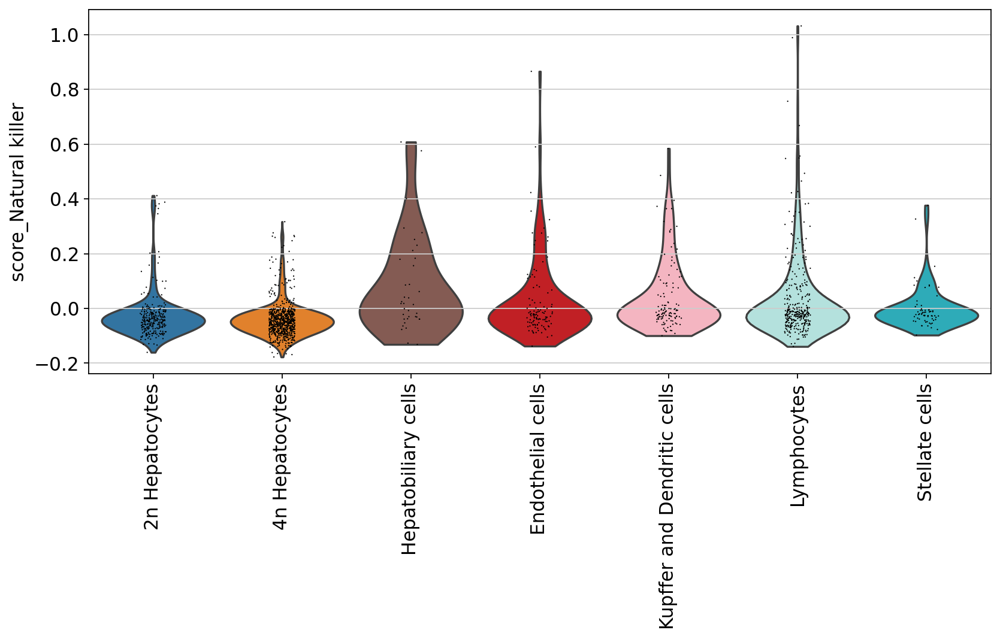

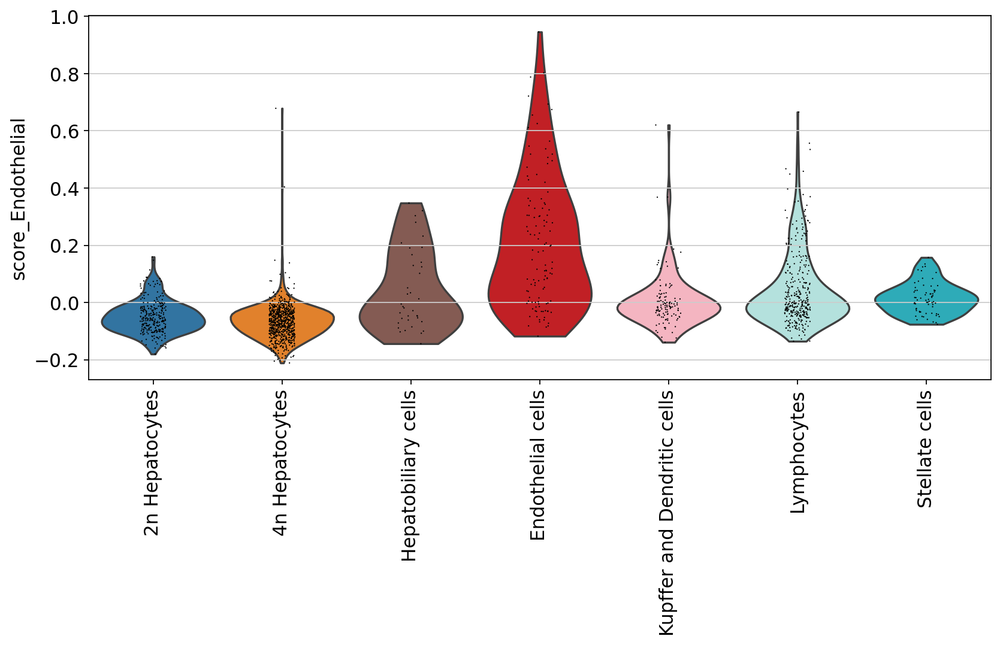

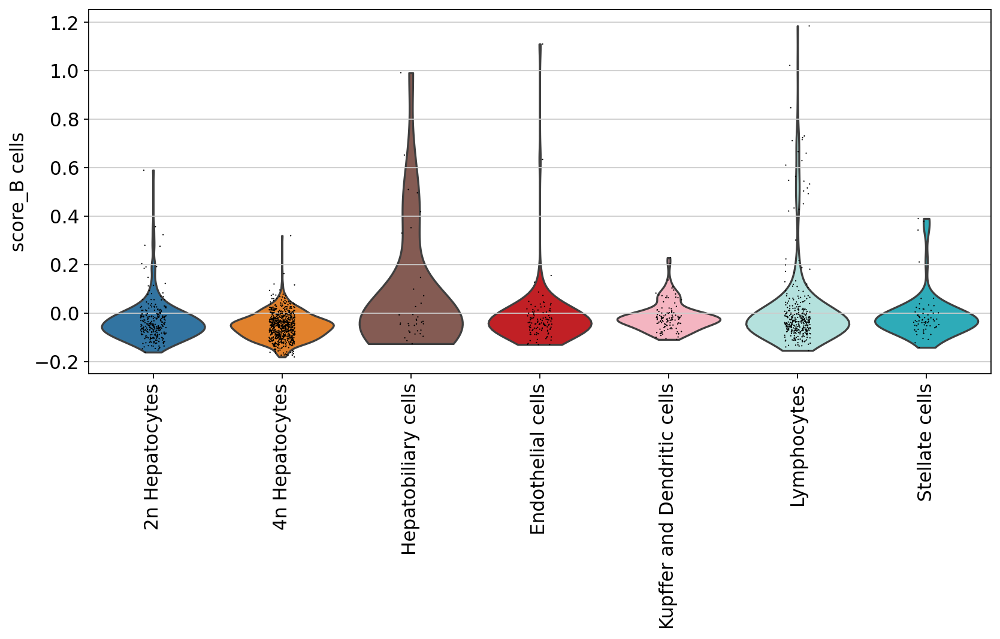

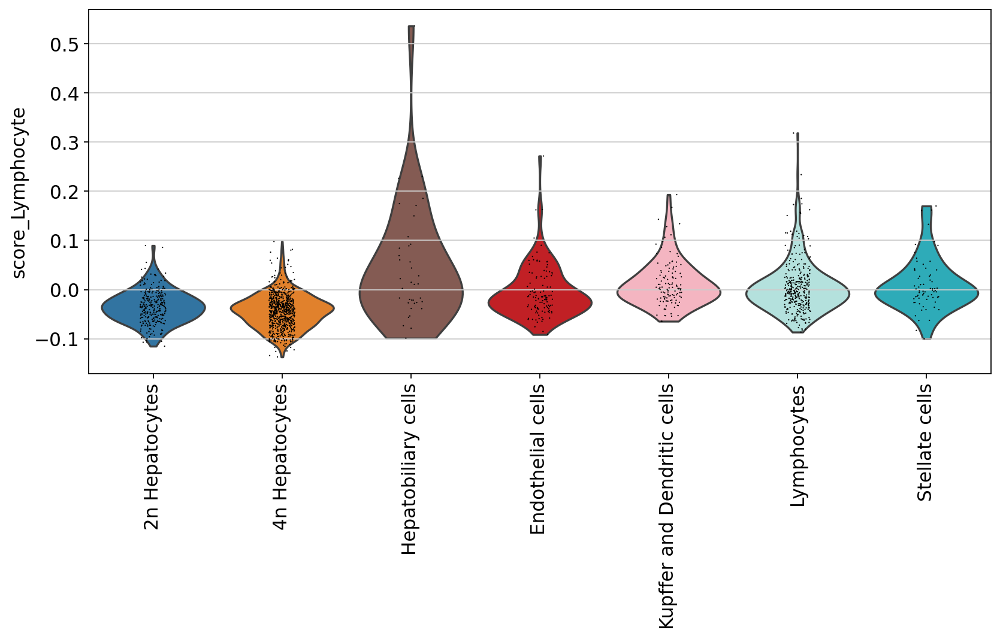

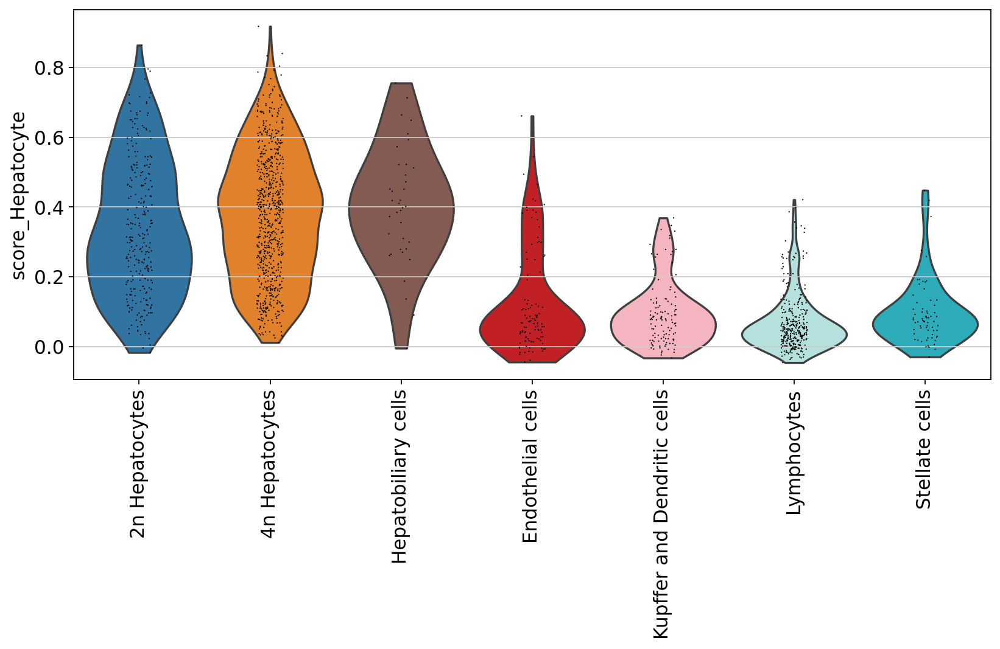

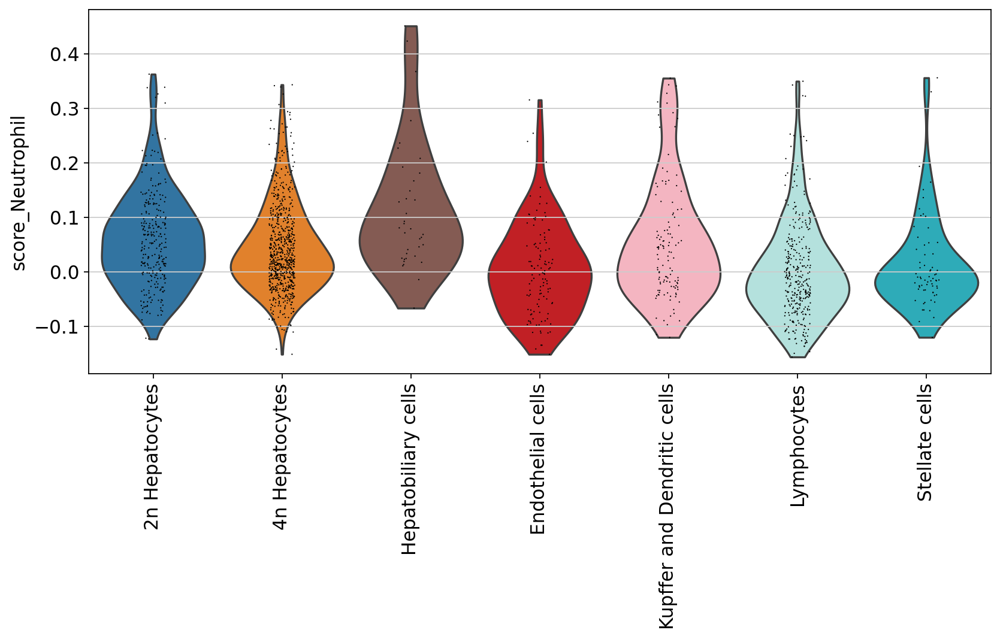

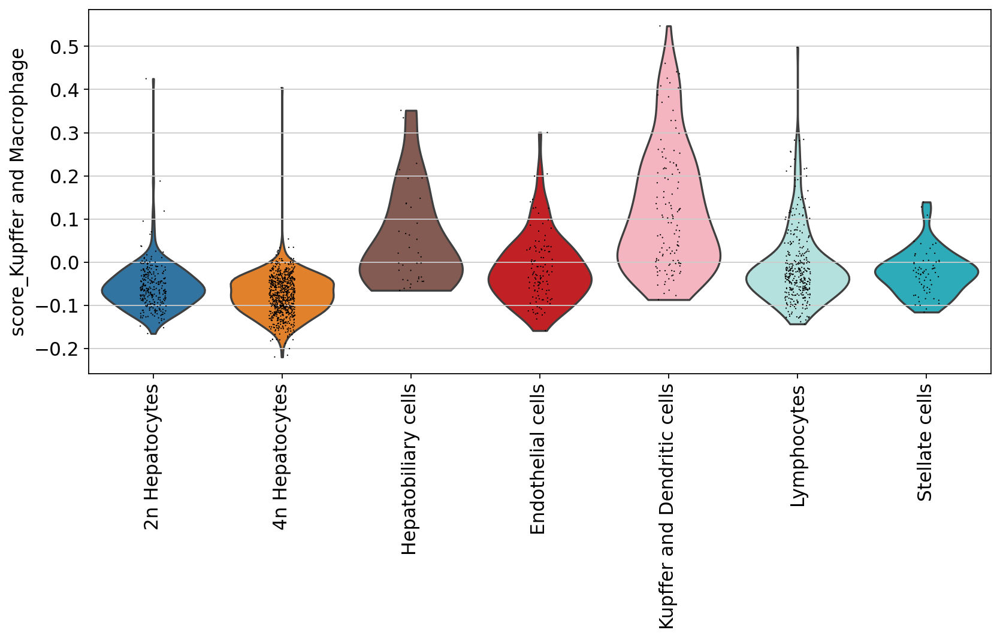

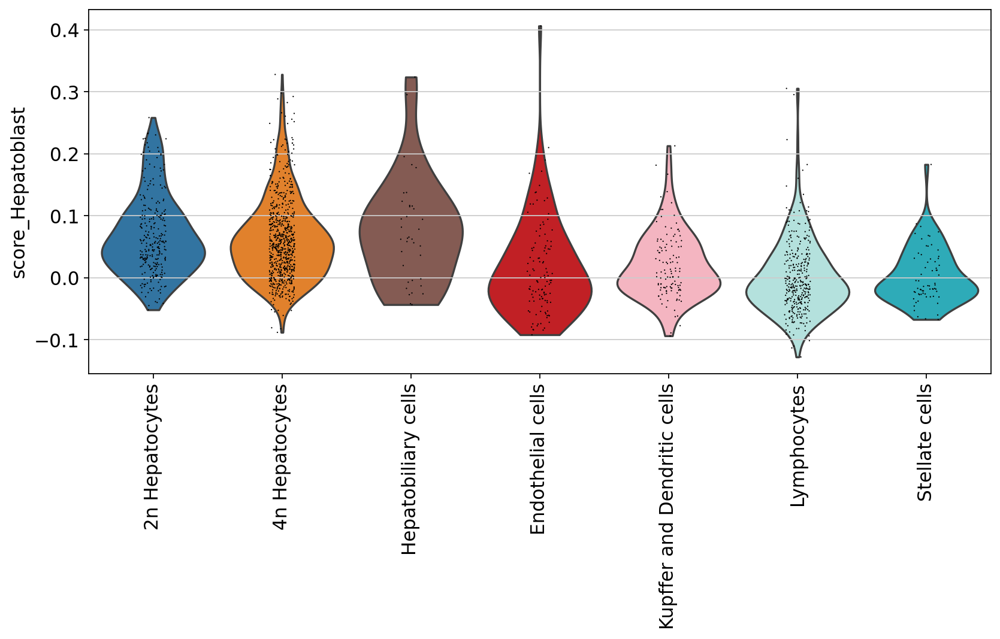

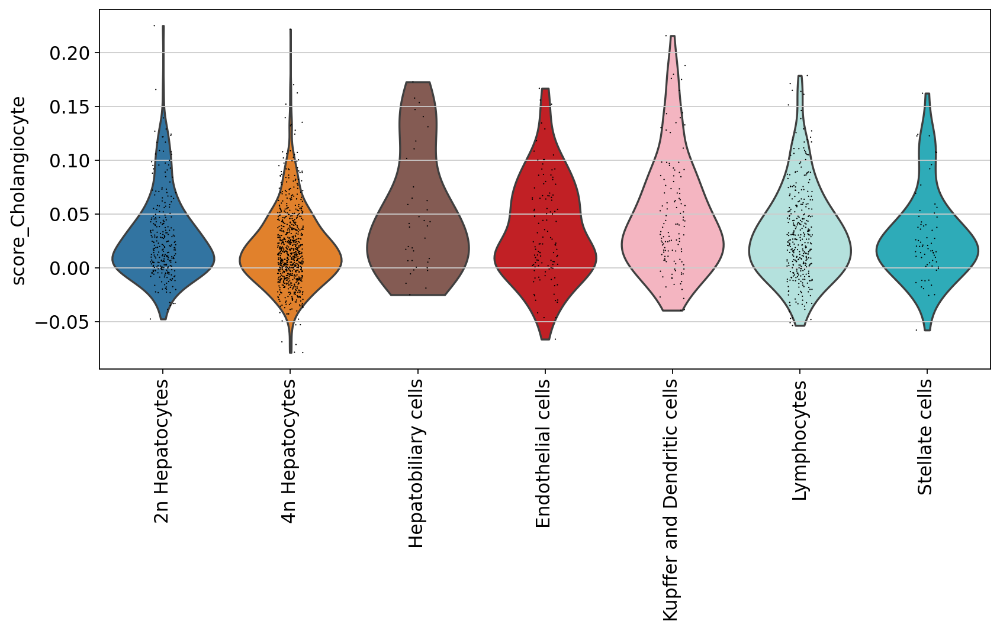

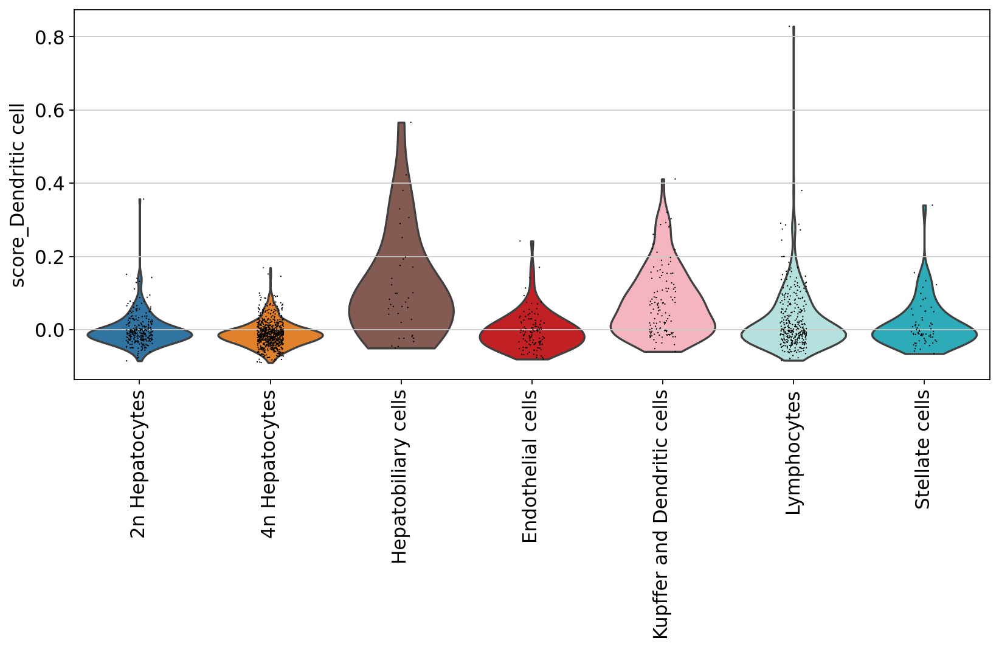

In [81]:
rcParams['figure.figsize']=(10,5)
for key in adata_old.obs.keys():
    if key.startswith('score_'):
        phase_key = key.split('_')[1] #do not show cell cycle scores
        if phase_key.startswith('G') or phase_key.startswith('S'):
            continue
        sc.pl.violin(adata_old, keys=key, groupby='cell_type', rotation=90)

Select knock out cells only and recompute embedding.

In [82]:
adata_old = adata_old[adata_old.obs['strain']==strain]

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [83]:
sc.pp.pca(adata_old, svd_solver='arpack')
sc.pp.neighbors(adata_old)
sc.tl.tsne(adata_old, perplexity=30, n_pcs=10)

In [84]:
chol_markers = ['Sptbn1','Sox9','Sox4','Kit','Slc22a3',
                'Hnf1b','Erbb3','Fgfr2','Fgfr3','Sorl1','Wwc1',
                'Cftr','Pkd2','Pkhd1l1','Lrp2','Cdh11','Igfbp5','Wt1','Igfbp6',
                'Wnt2b','Bmp4','Sulf2','Gas1','Gpc3','Vim','Fgf1','Onecut1',
                'Klra2','Ccl5','Pla2g7','Clec12a','Itgal','Folr2','Cybb','Cd38',
                'Epcam','Cdh1']

hepatoblast_markers = ["Ncam1","Cd44","Dlk1","Icam1","Epcam","Cdh1","Onecut3","Afp","Agt","Fgg",
                       "Gsta1","Id3","Lin28b","Etv5","Lgr5","Tbx3","Foxm1","Kit",
                      "Onecut1","Onecut2","Notch2","Tbx3","Hnf1b","Hes1","Foxa2","Foxa3","Hhex",
                       "Sall4","Hnf4a","Alb","Krt19","Epcam","Tacstd2","Anpep","Itga6","Cd133",
                       "Thy1","Fgf7","Sox9","Krt18","Krt19","Cebpa","Serpina16","Mki67","Krt7",
                       "Tmem45b","Tacstd2","Igdcc4","Itga6","Ptprcap","Atxn1"]

nmarker_name = {}
nmarker_id = []
index = 0
for n in adata_old.var["gene_name"].tolist():
    if n in hepatoblast_markers:
        nmarker_name[n] = adata_old.var_names[index]
        nmarker_id.append(adata_old.var_names[index])
    index += 1

adatah = adata_old[:,nmarker_id].copy()

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [85]:
adata_old.obs["hblast_marker_sum"] = np.sum(adatah.layers["raw"], axis=1)

Color the clusters nicely

In [86]:
adata_old.uns["low_res_ct_colors"] = ["#686868", "#a9a9a9"]

Combine the hepatocytes and re-arrange the levels.

In [87]:
adata_old.obs['cell_type1'] = adata_old.obs['cell_type'].cat.add_categories(['Hepatocytes'])
adata_old.obs['cell_type1'][np.in1d(adata_old.obs['cell_type'], ["2n Hepatocytes", "4n Hepatocytes"])] = 'Hepatocytes'
adata_old.obs['cell_type1'] = adata_old.obs['cell_type1'].cat.remove_unused_categories()
adata_old.obs['cell_type1'] = adata_old.obs['cell_type1'].cat.reorder_categories(['Hepatocytes', 
                                              'Hepatobiliary cells', 'Endothelial cells', 
                                     "Kupffer and Dendritic cells", 'Lymphocytes','Stellate cells',
                                   
                                                                         ])

In [88]:
adata_old.uns["cell_type1_colors"] = ["#332288", #Hepatocyte color
                                       "#8c564b",
                                       "#DC050C","#FFAABB","#ade8e3","#17becf"]

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


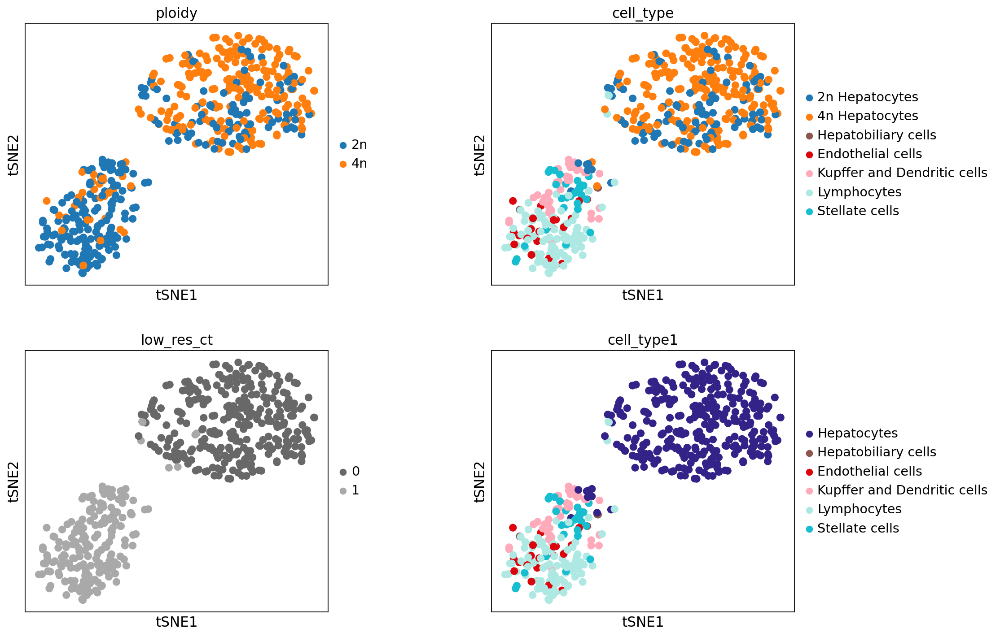

In [90]:
rcParams['figure.figsize']=(5,5)
sc.pl.tsne(adata_old, color=["ploidy", "cell_type","low_res_ct", "cell_type1"],
           ncols=2, wspace=0.4, save='_'+today +"_old_"+ko_prefix+"_prelim_annotation.pdf")

Save the annotated adata

In [91]:
adata_old.write(data_dir + 'snRNAseq_mouse_hepatocytes_old_' +ko_prefix+ '_filtered_TPM_jul21_annotated.h5ad')

/home/icb/maren.buettner/anaconda3/envs/sc-tutorial/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [16]:
adata_old = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_old_' +ko_prefix+ '_filtered_TPM_jul21_annotated.h5ad')

In [17]:
# plotting the markers nicely (using scanpy 1.6)
small_marker_dict = {"Hepatocytes":["Cyp27a1","Ppara","Pck1"],
                    "Hepatobiliary cells":["Lgr5","Id3","Fgg"],
                    "Endothelial cells":["Dnase1l3","Ptprb","Stab2", "Clec4g", "Flt1","Gpihbp1"],
                    "Kupffer and Dendritic cells":["Clec4f","Slc40a1","Cd5l", "Adgre1",  
                                                   "Cd68", "Cd163", "Vsig4", "H2-Aa"],
                    "Lymphocytes":["Bcl2","Syk","Lck", 'Lsp1'],
                     "Neutrophils":["Csf3r", "Retnlg"],
                     'Stellate cells': ['Reln'],
                    "B cells": ["Cd79a", "Bank1", "Igkc", 'Eaf2'],
                     "T cells": ["Bach2"],
                    "NK cells": ["Clec1b", "Klrb1c", "Nkg7"]}

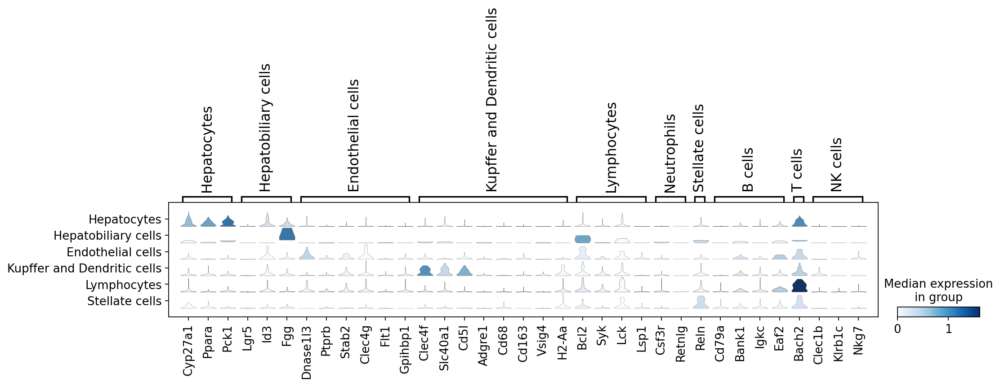

In [18]:
sc.pl.stacked_violin(adata_old, gene_symbols="gene_name", groupby="cell_type1", 
                     var_names=small_marker_dict, 
                          save='_' + today + "_old_"+ko_prefix+"_prelim_annotation_markers.pdf")

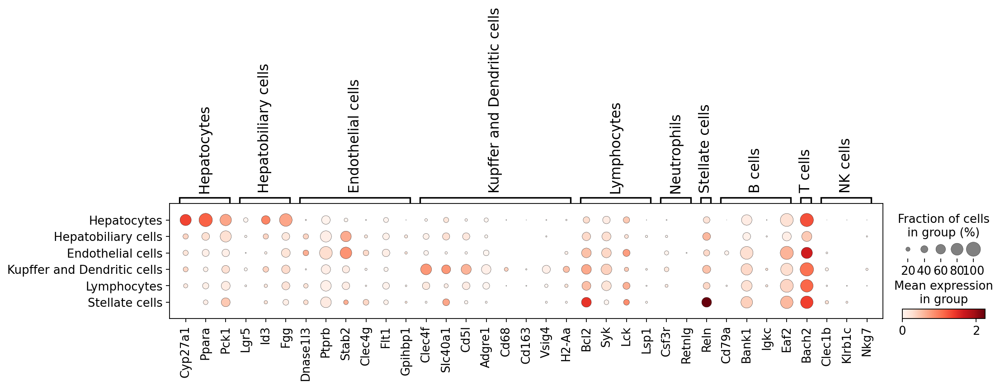

In [19]:
sc.pl.dotplot(adata_young, gene_symbols="gene_name", groupby="cell_type1", 
                     var_names=small_marker_dict, save='_'+today+"_young_" + ko_prefix+ "_prelim_annotation_markers.pdf")

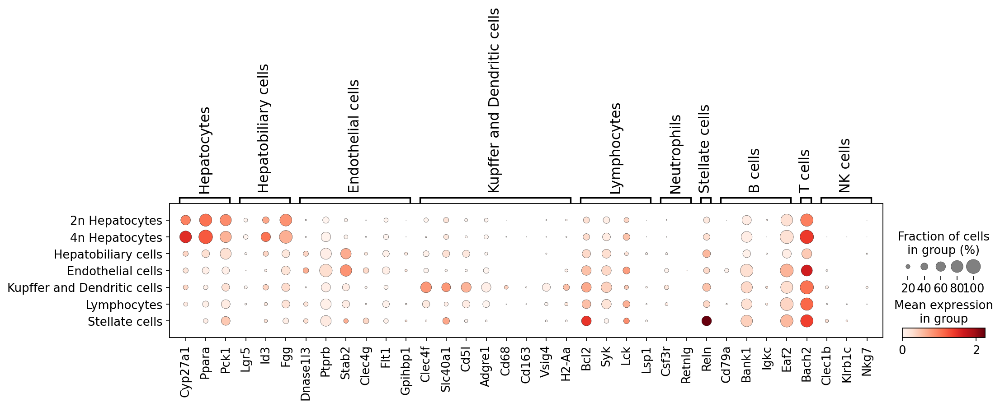

In [20]:
sc.pl.dotplot(adata_young, gene_symbols="gene_name", groupby="cell_type", 
                     var_names=small_marker_dict, save='_'+today+"_young_" + ko_prefix+ "_prelim_annotation_markers2.pdf")

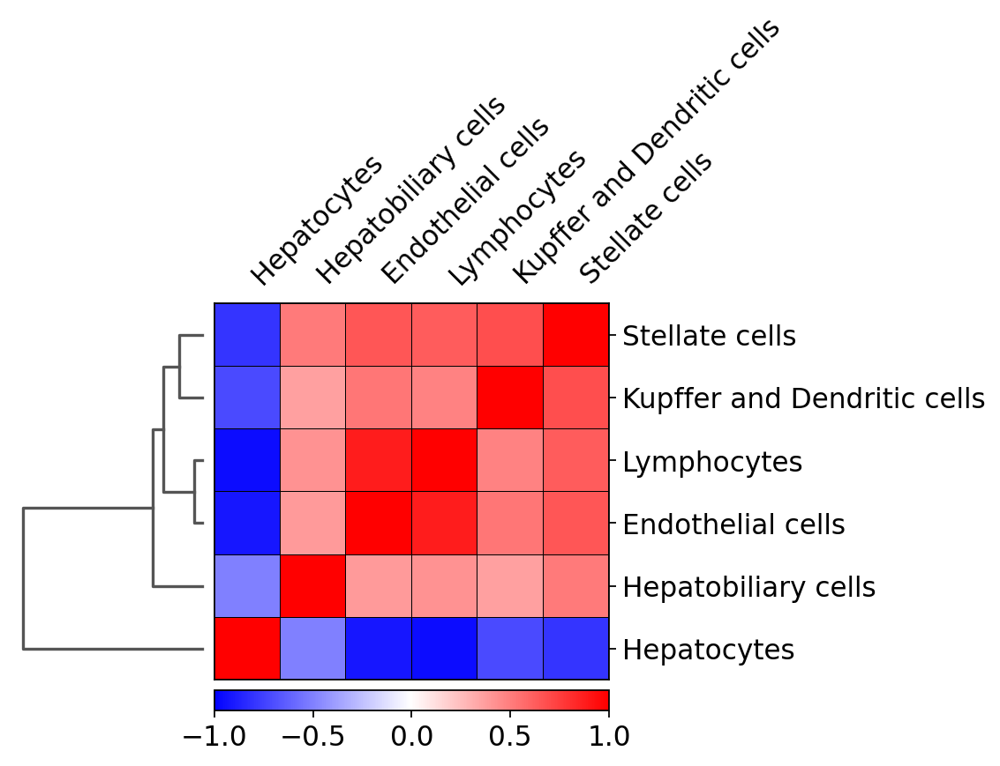

In [21]:
sc.pl.correlation_matrix(adata_old, groupby="cell_type1",
                         save='_' + today + "_old_"+ko_prefix+"_correlation_matrix.pdf")

End of the KO annotation notebook.